# Additional Data Sets

_Author: Nathan Robertson_

In this notebook, I'll be working on bringing together other data sets that will help enrich the information we have about each listing.

Why do we need additional data sets? The Zillow dataset gives us a lot of good information about the listings themselves. But when someone is determining what the want to spend on a house, it isn't just about the house. It is about assessing the area around the house. Is it a safe area? Are there things to do? Are there undesirable attributes, like a prison or a dirty fuel power plant, nearby?

This notebook will seek to gather a range of datasets to create the notion of a **points of interest** map. We'll use this data to help chart information about the area surrounding each listing. This information I believe will be critical for building out a stronger pricing prediction.

In [1]:
# Import packages

# For wrangling and manipulating data.
import pandas as pd
import numpy as np
import re
import json

# For dealing with geospatial data.
import fiona
from fiona.crs import to_string
import geojson
from shapely.geometry import Point, Polygon

# For mathematical operations.
import math
import random

# for connecting to APIs.
import requests

# For time tracking.
from tqdm import tqdm

# For data visualization.
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import Image

# parallel processing.
from multiprocessing import Pool


### Getting started

First, I'll load in the cleaned zillow listing data. I'll also define a dictionary of two-letter state codes and state names (this will be used multiple times as I manipulate data sources that use one value or the other to store the state).

In [2]:
# Read in listings data.
print('loading zillow listing data...')
listings = pd.read_csv('data/backup/BACKUP cleaned_zillow_data.csv')
print('loading complete!')

loading zillow listing data...
loading complete!


In [3]:
state_abbreviations = {
    'AL': 'Alabama','AK': 'Alaska','AZ': 'Arizona','AR': 'Arkansas','CA': 'California','CO': 'Colorado',
    'CT': 'Connecticut','DE': 'Delaware','FL': 'Florida','GA': 'Georgia','HI': 'Hawaii','ID': 'Idaho',
    'IL': 'Illinois','IN': 'Indiana','IA': 'Iowa','KS': 'Kansas','KY': 'Kentucky','LA': 'Louisiana',
    'ME': 'Maine','MD': 'Maryland','MA': 'Massachusetts','MI': 'Michigan','MN': 'Minnesota','MS': 'Mississippi',
    'MO': 'Missouri','MT': 'Montana','NE': 'Nebraska','NV': 'Nevada','NH': 'New Hampshire','NJ': 'New Jersey',
    'NM': 'New Mexico','NY': 'New York','NC': 'North Carolina','ND': 'North Dakota','OH': 'Ohio','OK': 'Oklahoma',
    'OR': 'Oregon','PA': 'Pennsylvania','RI': 'Rhode Island','SC': 'South Carolina','SD': 'South Dakota',
    'TN': 'Tennessee','TX': 'Texas','UT': 'Utah','VT': 'Vermont','VA': 'Virginia','WA': 'Washington',
    'WV': 'West Virginia','WI': 'Wisconsin','WY': 'Wyoming'
}

We'll also create a function that can quickly spin up a map with latitude / longitude coordinates. This will help us look at the distribution of points of interests in each data set.

In [4]:
"""
visualize_locations

Create visualization of the United States, where each points represents a "point of interest" in the dataset.

    Args:
        df: the "point of interest" dataset that will be visualized. Must have columns "latitude" and "longitude".
        filename: the name of the file that will be generated for the visual. Most of these visuals have 1,000s+
        points of interest, and it is easier to render the flat file than to try and render the whole thing live.
        color: if there is a categorical variable that the visualiation should be colored by, this arg handles that.
    
    Returns:
        A visualization of the points of interest data set on a map of the United States.
"""

def visualize_locations(df, filename, color=None):
    
    # If no color, create basic scatter_geo.
    if color==None:
    
        plot = px.scatter_geo(
        df, 
        lat="latitude", 
        lon="longitude", 
        title=filename
    ) 
    
    # If color, add color to args for scatter_geo.
    else:
        
        plot = px.scatter_geo(
        df, 
        lat="latitude", 
        lon="longitude",
        color=color,
        title=filename
    ) 

    # Zoom into the US.
    plot.update_layout(
        geo=dict(
            scope="usa",
        )
    )

    # Save file locally.
    plot.write_image(f'notebook_assets/6 - {filename}.png')

    # Render .PNG image.
    return Image(f'notebook_assets/6 - {filename}.png')

### Starbucks

Starbucks. The hallmark of middle class suburbia in the 21st century. Unfortunately, upon inspection this dataset has some pretty big gaps in it. Multiple states, like Oklahoma, have no Starbucks at all (as someone who grew up in a town in Oklahoma where there were at least 5 Starbucks, I know this isn't true).

I am keeping the code here to preserve the effort, but I don't plan on using this.

In [5]:
# Read file.
starbucks = pd.read_csv('data/third_party_data/starbucks_us_locations.csv')

In [6]:
# Take a look at the first 5 records.
starbucks.head()

,longitude,latitude,storeName,address
0,-149.893556,61.217592,Starbucks - AK - Anchorage 00001,"601 West Street_601 West 5th Avenue_Anchorage,..."
1,-149.905495,61.195339,Starbucks - AK - Anchorage 00002,Carrs-Anchorage #1805_1650 W Northern Lights B...
2,-149.752200,61.229700,Starbucks - AK - Anchorage 00003,Elmendorf AFB_Bldg 5800 Westover Avenue_Anchor...
3,-149.864336,61.195251,Starbucks - AK - Anchorage 00004,Fred Meyer - Anchorage #11_1000 E Northern Lig...
4,-149.837973,61.137514,Starbucks - AK - Anchorage 00005,Fred Meyer - Anchorage #656_2300 Abbott Road_A...


In [7]:
# Drop irrelevant columns.
starbucks.drop(columns=['address'], inplace=True)

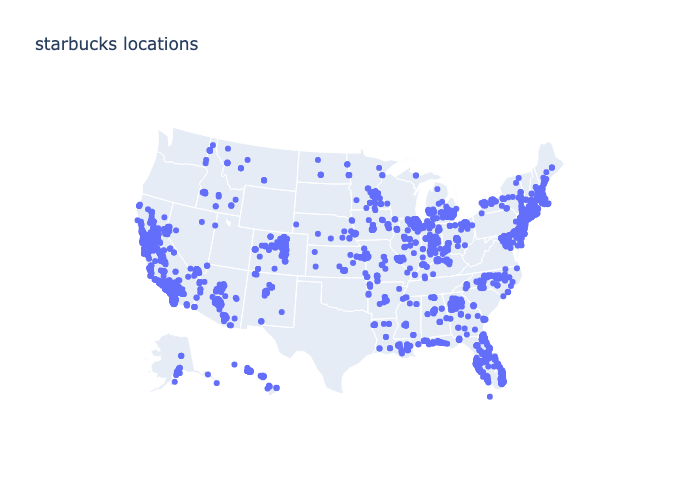

In [8]:
# Visualize Starbucks points of interest.
image = visualize_locations(starbucks, "starbucks locations")
image

In [9]:
# Save results.
starbucks.to_csv('data/backup/BACKUP cleaned_starbucks_us_locations.csv')

### National Parks

National Parks are big summer tourism hot spots. While there aren't a lot of them, I suspect being close to them can have a nontrivial impact on a home's value.

In [10]:
# Read data.
national_parks = pd.read_csv('data/third_party_data/national_parks_locations.csv')

In [11]:
# Look at results. Nothing to change.
national_parks.head()

,parkName,latitude,longitude
0,"Grand Teton National Park, WY, USA",43.790802,-110.684944
1,"Grand Canyon National Park, AZ, USA",36.266033,-112.363808
2,"Capitol Reef National Park, UT, USA",38.089600,-111.149910
3,"Pinnacles National Park, CA, USA",36.491508,-121.197243
4,"Rocky Mountain National Park, CO, USA",40.343182,-105.688103


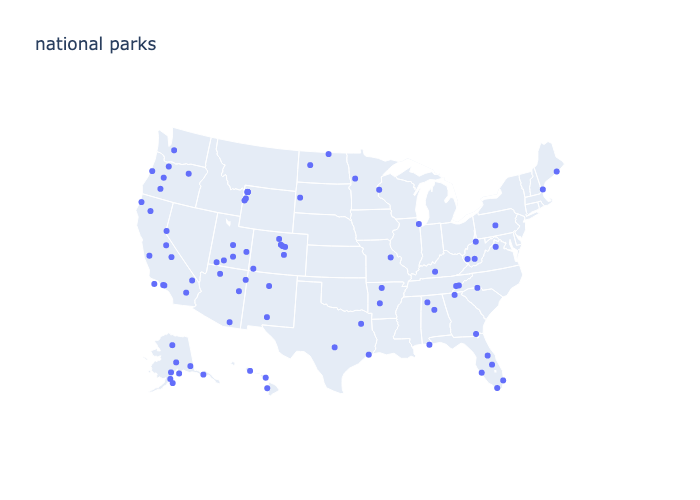

In [12]:
# Visualize data.
image = visualize_locations(national_parks, "national parks")
image

In [13]:
# Save data.
national_parks.to_csv('data/backup/BACKUP cleaned_national_parks_locations.csv')

### Post Office

The inspiration for this one came from my wife. When we were looking for a home to buy for our family, she told me, "I need to be within 5 minutes of a post office." While this isn't a major luxury, it's nice to be able to drive right down the road when you need to send mail!

In [14]:
# Read in data.
post_offices = pd.read_csv('data/third_party_data/post_office_locations.csv')

<ipython-input-14-ba8dd8f79338>:2: DtypeWarning:

Columns (5,6,11) have mixed types. Specify dtype option on import or set low_memory=False.



In [15]:
# Look at first 5 records.
post_offices.head()

,Name,AltName,OrigName,State,County1,County2,County3,OrigCounty,Established,Discontinued,...,GNIS.FEATURE_ID,GNIS.Feature.Class,GNIS.OrigName,GNIS.OrigCounty,GNIS.Latitude,GNIS.Longitude,GNIS.ELEV_IN_M,GNIS.MatchScore,Latitude,Longitude
0,A AND M COLLEGE,NaN,A AND M COLLEGE,MS,OKTIBBEHA,NaN,NaN,Oktibbeha,1922.0,1932.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,A. B. C.,NaN,A. B. C.,TN,SUMNER,NaN,NaN,Sumner,1880.0,1914.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AARON,NaN,AARON,MO,BATES,NaN,NaN,Bates,1895.0,1933.0,...,2091668.0,Post Office,Aaron Post Office (historical),Bates,38.422222,-94.154167,268.0,1.0,38.422222,-94.154167
3,AARON,NaN,AARON,TN,BENTON,NaN,NaN,Benton,1889.0,1890.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AARON,NaN,AARON,TN,BRADLEY,NaN,NaN,Bradley,1860.0,1860.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# Drop irrelevant columns.
post_offices = post_offices[['Name','State','OrigCounty','Established','Discontinued','Latitude','Longitude']]

# Get only active post offices.
post_offices = post_offices[post_offices['Discontinued'].isnull()]

# Get only post offices with recorded latitude / longitude locations.
post_offices = post_offices[(~post_offices['Latitude'].isnull()) & (~post_offices['Longitude'].isnull())]

# Rename columns for lower case.
post_offices.columns = ['name','state','county','established','discontinued','latitude','longitude']

# Look at cleaned results.
post_offices.head()

,name,state,county,established,discontinued,latitude,longitude
8,AARONSBURG,PA,Centre,1792.0,NaN,40.898967,-77.452199
15,ABBVILLE,LA,Vermilion,1847.0,NaN,29.982027,-92.121138
18,ABBEVILLE,MS,Lafayette,1843.0,NaN,34.502778,-89.501658
19,ABBEVILLE,AL,Henry,1833.0,NaN,31.571367,-85.248371
20,ABBEVILLE,GA,Wilcox,1860.0,NaN,31.992214,-83.308475


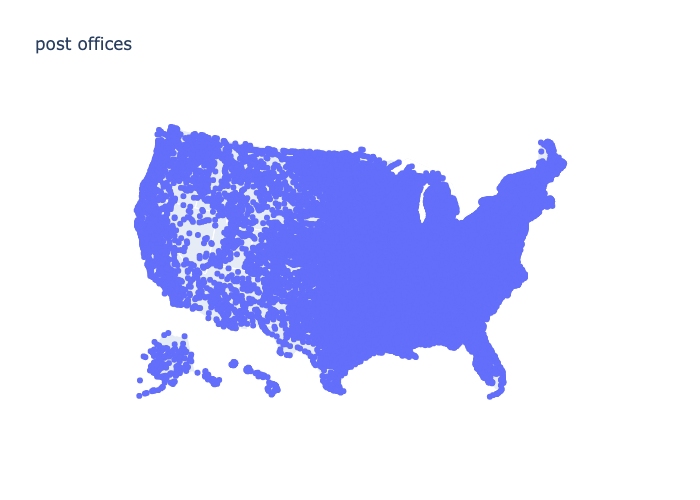

In [17]:
# Visualize locations of post offices.
image = visualize_locations(post_offices, "post offices")
image

In [18]:
# Save results.
post_offices.to_csv('data/backup/BACKUP cleaned_post_office_locations.csv')

### Museums

Museums are good cultural/education points of interest. Museums can also be proxies for central areas in towns and cities. But: the size and scope of museums can vary dramatically. So we'll need to account for that in the data cleaning.

In [19]:
# There are three different source files. Read in each one.
part1 = pd.read_csv('data/third_party_data/museums/museum_file1.csv', encoding='windows-1252')
part2 = pd.read_csv('data/third_party_data/museums/museum_file2.csv', encoding='windows-1252')
part3 = pd.read_csv('data/third_party_data/museums/museum_file3.csv', encoding='windows-1252')

In [20]:
# Combine into one DataFrame, and reset the index.
museums = pd.concat([part1, part2, part3]).reset_index()

In [21]:
# Drop irrelevant columns.
museums = museums[['COMMONNAME','PHCITY','PHSTATE','INCOME15','LONGITUDE','LATITUDE']]

# rename columns.
museums.columns = ['commonName','phCity','phyState','income15','longitude','latitude']

# Drop records where there is not latitude or longitude.
museums = museums[(museums['latitude']!=' ') & (museums['longitude']!=' ')]

# Convert datatype to float.
museums['latitude'] = museums['latitude'].astype(float)
museums['longitude'] = museums['longitude'].astype(float)

In [22]:
# Peek at results.
museums.head()

,commonName,phCity,phyState,income15,longitude,latitude
0,STURDIVANT HALL,,,789462,-87.02243,32.40623
1,SLOSS FURNACES NATIONAL HISTORIC LANDMARK,,,375106,-86.78855,33.52109
2,NORTHPORT HERITAGE MUSEUM,,,0,-87.58354,33.23036
3,ORDEMAN-SHAW HOUSE,,,,-86.30384,32.38171
4,MAGNOLIA GROVE,,,,-87.59424,32.71317


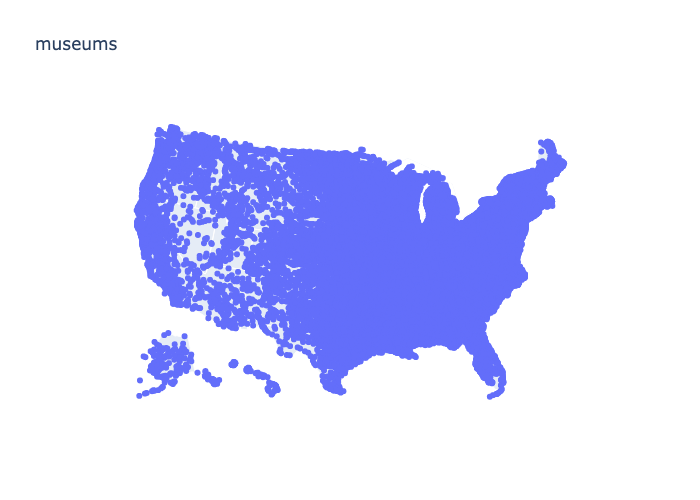

In [23]:
# Visualize distribution.
image = visualize_locations(post_offices, "museums")
image

Looking at the data file, I'm seeing several rough tiers of museum based on the size of their reported revenue. Being near to a lage museum (Boston Fine Arts Museum) vs a small museum (Joe's snail museum) likely have different impacts on home value. Let's categorize the museums with some custom binning now to capture that.

In [24]:
"""
revenue_tier

Converts the annual income of a museum into the size of the museum: massive, large, medum, small, tiny.

    Args:
        The revenue associated with a museum.
        
    Returns:
        a categorical variable (massive, large, et cetera...) representing the revenue. If revenue is null,
        return 'tiny'.

"""

def revenue_tier(revenue):
    
    try:
        revenue = int(revenue)
        
        if revenue >= 1000000000:
            return 'massive' # >1B
        elif revenue >= 100000000:
            return 'large' # 100M - 1B
        elif revenue >= 10000000:
            return 'medium' # 10M - 100M
        elif revenue >= 1000000:
            return 'small' #1M-10M
        else:
            return 'tiny' #<1M
        
    except:
        return 'tiny'

In [25]:
# Apply function.
museums['revenue_tier'] = museums['income15'].apply(revenue_tier)

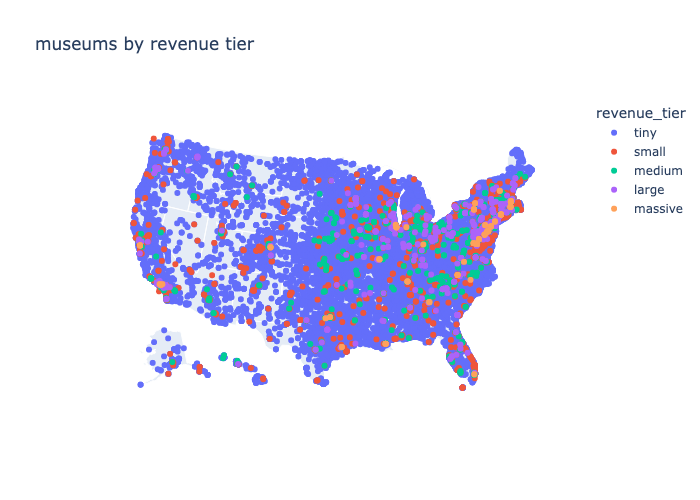

In [26]:
# Visualized tiered results.
image = visualize_locations(museums, "museums by revenue tier", 'revenue_tier')
image

In [27]:
# See how many fall into each category.
museums.groupby('revenue_tier').size()

revenue_tier
large        493
massive      134
medium       645
small       1404
tiny       27433
dtype: int64

In [28]:
# Save Results.
museums.to_csv('data/backup/BACKUP cleaned_museums_locations.csv')

### Alltrails

Access to the great outdoors! A good trail and easy access to nature is a great benefit for ahome. Let's see if we can use data scraped from Alltrails as a good source for trails.

In [29]:
# A little redundant with the state_abbreviations function, but was helpful to have a unique list to read in
# Trail data from the District of Columbia (Washington DC).
states = ["Alabama","Alaska","Arizona","Arkansas","California","Colorado",
  "Connecticut","Delaware","District of Columbia","Florida","Georgia","Hawaii","Idaho","Illinois",
  "Indiana","Iowa","Kansas","Kentucky","Louisiana","Maine","Maryland",
  "Massachusetts","Michigan","Minnesota","Mississippi","Missouri","Montana",
  "Nebraska","Nevada","New Hampshire","New Jersey","New Mexico","New York",
  "North Carolina","North Dakota","Ohio","Oklahoma","Oregon","Pennsylvania",
  "Rhode Island","South Carolina","South Dakota","Tennessee","Texas","Utah",
  "Vermont","Virginia","Washington","West Virginia","Wisconsin","Wyoming"]

In [30]:
"""
extract_lat

A helper function for extracting latitude from geolocation data.

    args:
        x: a geolocation object.
        
    returns:
        latitude.
"""

def extract_lat(x):
    lat = x['lat']
    return lat

"""
extract_lng

A helper function for extracting longitude from geolocation data.

    args:
        x: a geolocation object.
        
    returns:
        longitude.
"""

def extract_lng(x):
    lng =  x['lng']
    return lng

"""
read_trail_data

Takes a json file for a single state's Alltrail trails, and cleans it into a workable shape.

    args:
        state: the state whose json file is being processed.
        
    returns:
        the cleaned Alltrails data set for that state.
"""

def read_trail_data(state):
    # Read the data.
    data = pd.read_json(f'data/third_party_data/alltrails/{state}.json')
    
    # Drop irrelevant columns.
    data=data[['name','_geoloc','length','elevation_gain','avg_rating','num_reviews','activities','difficulty_rating','popularity']]
    
    # Extract longitude and latitude, and then drop the column that held that data.
    data['latitude'] = data['_geoloc'].apply(extract_lat)
    data['longitude'] = data['_geoloc'].apply(extract_lng)
    data.drop(columns='_geoloc',inplace=True)
    
    # Return the cleaned data.
    return data

In [31]:
# Now let's loop through all of the states in the US to create one dataset of trails.

# Empty list of DataFrames
data = []

# Read in each state's Alltrail data.
for state in states:
    data.append(read_trail_data(state))

# Concatenate all of the trail data together. Reset the index.
trail_data = pd.concat(data).reset_index()

In [32]:
# Take a peek at the data.
trail_data.head()

,index,name,length,elevation_gain,avg_rating,num_reviews,activities,difficulty_rating,popularity,latitude,longitude
0,0,Walls of Jericho Trail,10621.644,410.8704,4.5,534,"[birding, camping, hiking, nature-trips, trail...",5,28.3646,34.97677,-86.08019
1,1,Cave Creek Trail from Cheaha Trailhead,10782.578,336.8040,4.5,210,"[backpacking, camping, hiking]",3,19.2814,33.47097,-85.80614
2,2,Chinnabee Silent Trail,11748.182,271.8816,4.5,159,"[backpacking, birding, camping, fishing, hikin...",3,18.0826,33.45964,-85.87405
3,3,Rainbow Mountain Loop Trail,2414.010,112.7760,4.5,265,"[hiking, trail-running, walking]",3,16.7441,34.73412,-86.72833
4,4,Caney Creek Falls Trail,2735.878,72.8472,4.5,187,[walking],1,16.2399,34.23526,-87.43408


In [33]:
# How many trails are there?
len(trail_data)

55330

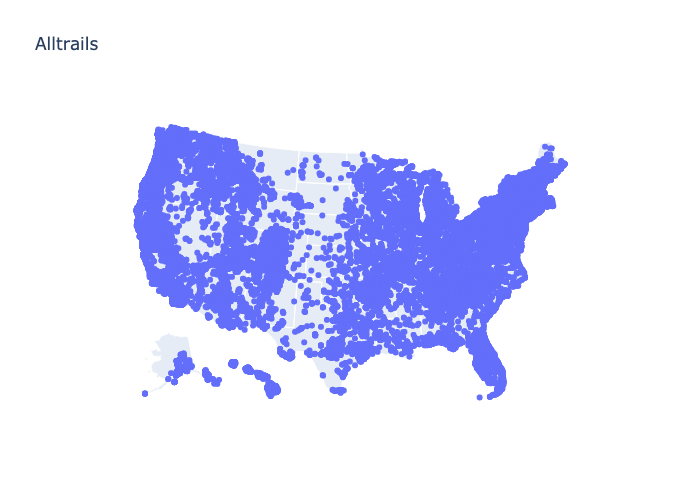

In [34]:
# Visualize the trails.
image = visualize_locations(trail_data, "Alltrails")
image

There are quite a few trails! Similar to the museums, I think there is an opportunity to bin these trails based on their features. Looking at the distributions, `popularity` and `num_reviews` seem like good ones to work with.

In [35]:
# histogram: # of trails by popularity score.
px.histogram(trail_data, x='popularity')

In [36]:
# Histogram: # of trails by num_reviews count.
px.histogram(trail_data, x='num_reviews')

Visualizing it as a scatterplot, we can break up the results into a 2x2 matrix: "Top Trails", "Hidden Gems", "Tough to Love" and "Under the Radar".

In [37]:
# Scatter plot.
fig = px.scatter(trail_data, x='num_reviews', y ='popularity')

# Draw median lines for each variable for the cut off in the 2x2 matrix.
fig.add_hline(y=np.median(trail_data['num_reviews']))
fig.add_vline(x=np.median(trail_data['popularity']))

# Show figure.
fig.show()

In [38]:
"""
trail_rater

A function for labeling trails based on its popularity/# of reviews (compared to the median values).

    args:
        n_reviews: the # of reviews a trail has.
        popularity: the popularity score a trail has.
        median_reviews: the median # of reviews a trail has across the dataset.
        median_popularity: the median popularity score a trail has across the dataset.
        
    returns:
        A label for the trail based on its reviews and popularity.
"""


def trail_rater(n_reviews, popularity, 
                median_reviews=np.median(trail_data['num_reviews']), 
                median_popularity=np.median(trail_data['popularity'])):
    
    if n_reviews >= median_reviews and popularity >= median_popularity:
        return 'Top Trail'
    elif n_reviews < median_reviews and popularity >= median_popularity:
        return 'Hidden Gem'
    elif n_reviews >= median_reviews and popularity < median_popularity:
        return 'Tough to Love'
    elif n_reviews < median_reviews and popularity < median_popularity:
        return 'Under the Radar'

In [39]:
# Apply function.
trail_data['trail_type'] = trail_data.apply(lambda x: trail_rater(x['num_reviews'], x['popularity']), axis=1)

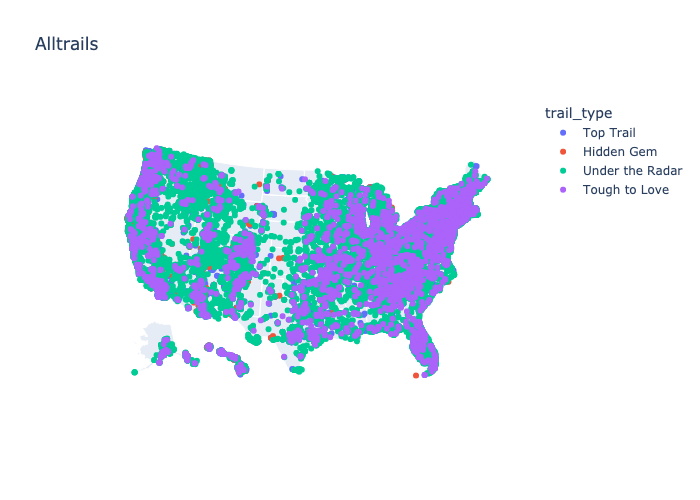

In [40]:
# Visualize trails based on their categories.
image = visualize_locations(trail_data, "Alltrails","trail_type")
image

In [41]:
# See the number of trails that fall under each bin.
trail_data.groupby('trail_type').size()

trail_type
Hidden Gem          2991
Top Trail          24675
Tough to Love       3443
Under the Radar    24221
dtype: int64

Two of the groups (Tough to Love, Hidden Gem) have much less representation in the dataset. But we'll keep it for now and see if it is useful to specify the trail type into 4 groups (vs. just 2).

In [42]:
# Save the data.
trail_data.to_csv('data/backup/BACKUP cleaned_alltrail_data.csv')

### Prisons

Being close to a prison is something I suspect would negatively influence the perceived value of a listing. So, let's bring in data for that.

In [43]:
# Read in data.
prisons = pd.read_csv('data/third_party_data/prison_locations.csv')

In [44]:
# Take a peek.
prisons.head()

,latitude,longitude,name,type,county,state,county_code,geoid,population,num_new,num_old
0,32.465298,-86.473973,Autauga Metro Jail,Local,Autauga County,AL,1001,10010202002008,181,1,0
1,30.885110,-87.774451,Baldwin County Jail,Local,Baldwin County,AL,1003,10030105001039,486,2,1
2,30.595724,-87.892566,Daphne City Jail,Local,Baldwin County,AL,1003,10030108001027,38,3,2
3,30.608661,-87.778375,Loxley Community Work Center,State,Baldwin County,AL,1003,10030109033013,505,4,3
4,30.524892,-87.902480,Fairhope City Jail,Local,Baldwin County,AL,1003,10030112012050,17,5,4


In [45]:
# Drop irrelevant columns.
prisons = prisons[['name','state','county','population','latitude','longitude']]

In [46]:
# Peek at data.
prisons.head()

,name,state,county,population,latitude,longitude
0,Autauga Metro Jail,AL,Autauga County,181,32.465298,-86.473973
1,Baldwin County Jail,AL,Baldwin County,486,30.885110,-87.774451
2,Daphne City Jail,AL,Baldwin County,38,30.595724,-87.892566
3,Loxley Community Work Center,AL,Baldwin County,505,30.608661,-87.778375
4,Fairhope City Jail,AL,Baldwin County,17,30.524892,-87.902480


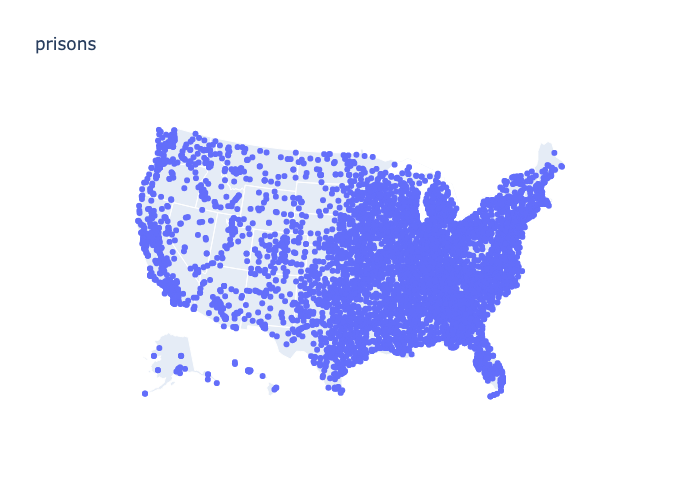

In [47]:
# Visualize data.
image = visualize_locations(prisons, "prisons")
image

In [48]:
# Save data.
prisons.to_csv('data/backup/BACKUP cleaned_prison_locations.csv')

### Power Plants

Power plants are necessary for keeping the lights on -- but you don't want one in your backyard. Additionally, you don't want one that comes from a "dirty" source of energy near your home (coal, natural gas, et cetera).

Let's bring in some data on power plants in the US, and bin them by "dirty" or "clean".

In [49]:
# Read in the data.
power_plants = pd.read_csv('data/third_party_data/power_plant_locations.csv')

<ipython-input-49-a108daf1b59b>:2: DtypeWarning:

Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.



In [50]:
# Take a peek at the data.
power_plants.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.322,65.1190,Hydro,NaN,NaN,...,123.77,162.90,97.39,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.670,65.7950,Solar,NaN,NaN,...,18.43,17.48,18.25,17.70,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.623,65.7920,Solar,NaN,NaN,...,18.64,17.58,19.10,17.62,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.556,69.4787,Hydro,NaN,NaN,...,225.06,203.55,146.90,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.641,69.7170,Hydro,NaN,NaN,...,406.16,357.22,270.99,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1


In [51]:
# Filter for only plants in the USA.
power_plants = power_plants[power_plants['country']=='USA']

# Drop irrelevant columns.
power_plants = power_plants[['name','primary_fuel','country','owner','latitude','longitude']]

# Take a peek at the data.
power_plants.head()

,name,primary_fuel,country,owner,latitude,longitude
24710,100 Brook Hill Drive Solar,Solar,USA,Diamond Properties,41.0930,-73.9828
24711,1025 Traveller Solar LLC,Solar,USA,CI-II Mitchell Holding LLC,35.4273,-79.1263
24712,1047 Little Mountain Solar LLC,Solar,USA,CI-II Mitchell Holding LLC,36.1971,-80.8067
24713,12 Applegate Solar LLC,Solar,USA,G&S Solar Installers LLC,40.2003,-74.5761
24714,126 Grove Solar LLC,Solar,USA,126 Grove Solar LLC,42.0761,-71.4227


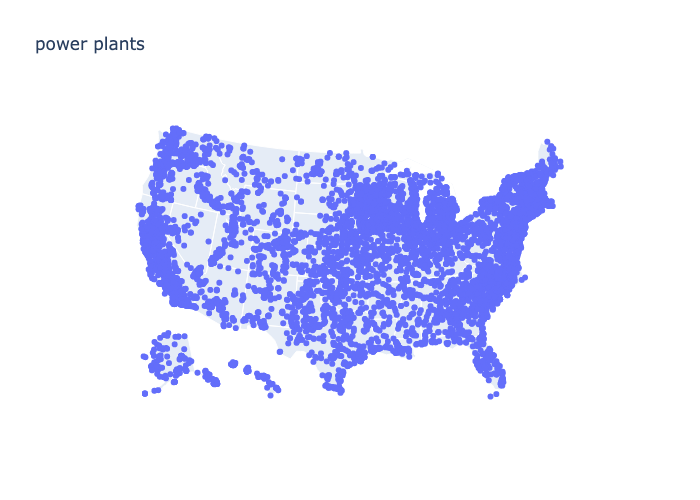

In [52]:
# Visualize the power plants.
image = visualize_locations(power_plants, "power plants")
image

In [53]:
# Take a look at the different types of fuels. What types are there?
power_plants.groupby('primary_fuel').size()

primary_fuel
Biomass          153
Coal             286
Cogeneration      34
Gas             1818
Geothermal        65
Hydro           1449
Nuclear           58
Oil              876
Other             16
Petcoke           11
Solar           3283
Storage          104
Waste            541
Wind            1139
dtype: int64

In [54]:
"""
categorize_primary_fuel

Assigns a label to a power plant based on its fuel type.

    args:
        fuel: the primary fuel type.
        
    returns:
        A label, either "clean" or "dirty", based on the primary fuel type.

"""


def categorize_primary_fuel(fuel):
    
    if fuel in ['Biomass','Cogeneration','Geothermal','Hydro','Nuclear','Solar','Storage','Wind']:
        return 'clean'
    elif fuel in ['Dirty Fuels','Coal','Gas','Oil','Other','Petcoke','Waste']:
        return 'dirty'

power_plants['fuel_type'] = power_plants['primary_fuel'].apply(categorize_primary_fuel)

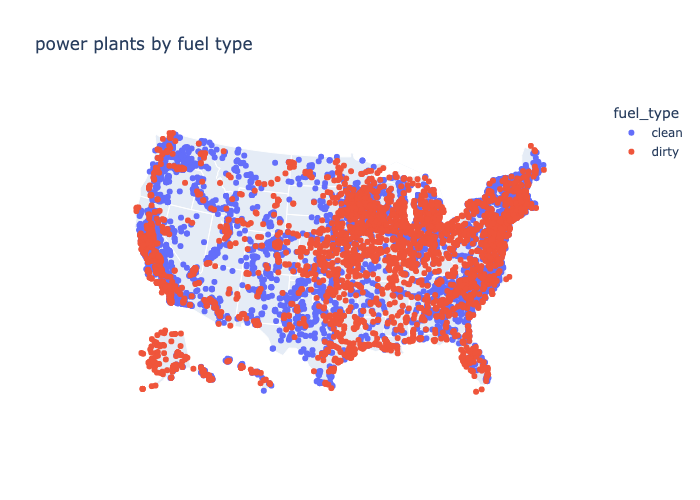

In [55]:
# Visualize the power plants by "clean" or "dirty".
image = visualize_locations(power_plants, "power plants by fuel type", "fuel_type")
image

In [56]:
# See how many power plants there are by type.
power_plants.groupby('fuel_type').size()

fuel_type
clean    6285
dirty    3548
dtype: int64

One factor I'm ignoring right now is the size of the power plant by gigawatt generation. I may choose to come back and revisit that later.

In [57]:
# Save the data.
power_plants.to_csv('data/backup/BACKUP cleaned_power_plants.csv')

### Crime Data

People buying homes value a safe neighborhood. So, we want to get some sense of what crime looks like in the neighborhood.

This one requires working with the FBI's open APIs for crime data. Fortunately, this is a free service the US federal government provides, so getting an API key was easy!

But, this did require more wrangling to get to the point that I could create a per capita representation of crime -- this is definitely the most labor intensive data source.

In [58]:
# API key to FBI Crime Data.
key = '1LSV3HIz06Lk0NKMUwEHpqJ01t9Qdc2deC1Z6Ty6'

# Looping over states, getting all of the ORIs
fin_data = []
for s in tqdm(state_abbreviations.keys()):
    url = f'https://api.usa.gov/crime/fbi/cde/agency/byStateAbbr/{s}?API_KEY={key}'
    data = requests.get(url)
    fin_data.append(pd.DataFrame(data.json()))

agency = pd.concat(fin_data,axis=0).reset_index(drop=True)

100%|██████████| 50/50 [01:00<00:00,  1.20s/it]


First, we get a dataset with every police agency in the United States. Let's take a look at it.

In [59]:
# Peek at data.
agency.head()

,ori,agency_name,agency_id,state_name,state_abbr,division_name,region_name,region_desc,county_name,agency_type_name,nibrs,nibrs_start_date,latitude,longitude
0,AL0010000,Jefferson County Sheriff's Office,49,Alabama,AL,East South Central,South,Region III,JEFFERSON,County,True,2021-01-01T00:00:00.000Z,33.553444,-86.896536
1,AL0010100,Bessemer Police Department,50,Alabama,AL,East South Central,South,Region III,JEFFERSON,City,True,2006-01-01T00:00:00.000Z,33.396152,-86.95345
2,AL0010200,Birmingham Police Department,51,Alabama,AL,East South Central,South,Region III,"JEFFERSON, SHELBY",City,True,2021-02-01T00:00:00.000Z,33.553444,-86.896536
3,AL0010300,Mountain Brook Police Department,52,Alabama,AL,East South Central,South,Region III,JEFFERSON,City,True,2021-01-01T00:00:00.000Z,33.50124,-86.75607
4,AL0010400,Fairfield Police Department,53,Alabama,AL,East South Central,South,Region III,JEFFERSON,City,False,None,33.553444,-86.896536


Now, with a dataset of agencies, we can call a separate endpoint that summarizes the arrests made for each agency. There are a couple dozen different types of crimes that are summarized (with definitions here: https://ucr.fbi.gov/crime-in-the-u.s/2019/crime-in-the-u.s.-2019/topic-pages/offense-definitions). I'm going to group these into `most_serious_crimes`, `serious_crimes`, and `less_serious_crimes`. Said another way: I want to know how much crime is in the neighborhood, but I don't want to treat "Vandalism" with the same severity that I would treat "Murder and Nonnegligent Manslaughter".

In [60]:
# Define categories of crimes by severity.
most_serious_crimes = ['Human Trafficking - Commercial Sex Acts','Human Trafficking - Involuntary Servitude',
                'Murder and Nonnegligent Manslaughter','Rape','Sex Offenses (Except Rape, and Prostitution and Commercialized Vice)'
               ]
serious_crimes = ['Aggravated Assault','Arson','Burglary','Driving Under the Influence','Larceny - Theft',
          'Manslaughter by Negligence','Motor Vehicle Theft','Offenses Against the Family and Children',
          'Prostitution and Commercialized Vice','Robbery','Simple Assault'
          ]

less_serious_crimes = ['All Other Offenses (Except Traffic)','Curfew and Loitering Law Violations','Disorderly Conduct',
                'Drug Abuse Violations - Grand Total','Drunkenness','Embezzlement','Forgery and Counterfeiting',
                'Fraud','Gambling - Total','Liquor Laws','Stolen Property: Buying, Receiving, Possessing','Suspicion',
                'Vagrancy','Vandalism','Weapons: Carrying, Possessing, Etc.'
               ]

Now, we'll create a function that uses the state agency data to create an agency-level representation of crime in 2022 (latest year available).

In [61]:
"""
generate_crime_data

Create a police agency level aggregation of the crimes that occurred in 2022.

    args:
        existing_data: if True, ignore all this and read in the data that has already been retrieved
        (prevents re-running this function unnecessarily!). If False, proceed with the job.
        
    returns:
        A DataFrame with the most_serious, serious, less_serious crimes in the jurisdictino of each agency,
        as well as the total and average stolen_value from thefts.
"""


def generate_crime_data(existing_data = False):
    
    # If True, just fetch the already-generated data - you are done!
    if existing_data == True:
        data = pd.read_csv('data/backup/BACKUP cleaned_crime_data.csv')
        return data
    
    # Otherwise, fetch the data from the FBI.
    else:
        
        # Empty results list.
        results = []
        
        # For each agency in the DataFrame `agency`.
        for i, row in tqdm(agency.iterrows(), total=len(agency), desc="calculating agency-level crimes..."):
            
            # fetch some data from the agency DataFrame that we want to persist.
            ori = row['ori']
            lat = row['latitude']
            lng = row['longitude']
            agency_name = row['agency_name']
            agency_id = row['agency_id']
            
            # Construct the URL to call the API endpoint arrest/agency/{insert agency}.
            url = f'https://api.usa.gov/crime/fbi/cde/arrest/agency/{ori}/all?from=2022&to=2022&API_KEY={key}'
            
            # Attempt to get the data via a request to the API.
            try:
                data = requests.get(url).json()['data'][0]
                
            # Otherwise, just create an empty DataFrame.
            except:
                data = {}
            
            # Summarize the crimes by category across the dictionary data.
            most_serious = sum(value for key, value in data.items() if key in most_serious_crimes)
            serious = sum(value for key, value in data.items() if key in serious_crimes)
            less_serious = sum(value for key, value in data.items() if key in less_serious_crimes)

            # This second URL calls the "expanded homicide" dataset -- what I really want from this is just the
            # population estimate. However, this is null the majority of the time -- I'll cover that later in the
            # notebook.
            url = f"https://api.usa.gov/crime/fbi/cde/shr/agency/{ori}/offense/count?from=2022&to=2022&API_KEY={key}"
            
            # Attempt to get the data via a request to the API.
            try:
                data = requests.get(url).json()
                population = data[0]['population']
                
            # Otherwise, population = None.
            except:
                population = None


            # Create a third and final URL for the "expanded burglary" dataset.
            url = f"https://api.usa.gov/crime/fbi/cde/supplemental/agency/{ori}/burglary/offense/byYearRange?from=2022&to=2022&API_KEY={key}"
            
            # Attempt to get the offense_count (# of burglaries) and total value stolen and average value stolen
            # per crime.
            try:
                data = requests.get(url).json()
                total_stolen_value = float(data['data'][0]['Stolen Value Total'])
                offense_count = float(data['data'][0]['Offense Count'])
                average_stolen_value = total_stolen_value/offense_count
            
            # Otherwise, the variables = None.
            except Exception as e:
                total_stolen_value = None
                offense_count = None
                average_stolen_value = None

            # Create a DataFrame with all of the results.
            df = pd.DataFrame(
            {'ori': ori, 'agency_name':agency_name, 'agency_id': agency_id, 
             'latitude': lat,'longitude':lng, 'most_serious': most_serious, 
             'serious': serious, 'less_serious': less_serious,
             'total_stolen_value': total_stolen_value, 'average_stolen_value': average_stolen_value, 
             'population':population},
            index=[0])
            
            # Append the DataFrame.
            results.append(df)

            # Every 50 records, save the data.
            if i % 50 == 0:
                crime_data = pd.concat(results)
                crime_data.to_csv('data/backup/BACKUP cleaned_crime_data.csv')

        # Concat the final results and save it one last time.
        crime_data = pd.concat(results)
        crime_data.to_csv('data/backup/BACKUP cleaned_crime_data.csv')
        
        # Return the data.
        return crime_data
        
    

In [62]:
# Generate crime data.
crime_data = generate_crime_data(existing_data=True)

In [63]:
# Take a peek at crime data.
crime_data.head()

,Unnamed: 0,ori,agency_name,agency_id,latitude,longitude,most_serious,serious,less_serious,total_stolen_value,average_stolen_value,population
0,0,AL0010000,Jefferson County Sheriff's Office,49,33.553444,-86.896536,2,684,768,5799151.0,9845.757216,149098.0
1,0,AL0010100,Bessemer Police Department,50,33.396152,-86.953450,6,453,1286,4287030.0,20317.677725,25265.0
2,0,AL0010200,Birmingham Police Department,51,33.553444,-86.896536,39,976,2126,4588615.0,3020.813035,195050.0
3,0,AL0010300,Mountain Brook Police Department,52,33.501240,-86.756070,0,86,323,494827.0,13745.194444,NaN
4,0,AL0010400,Fairfield Police Department,53,33.553444,-86.896536,0,0,0,NaN,NaN,NaN


The only major gap in this is that we don't have population estimates for nearly enough of the precincts for this to be useful. We need to normalize this data to be per capita representations. We'll handle that next.

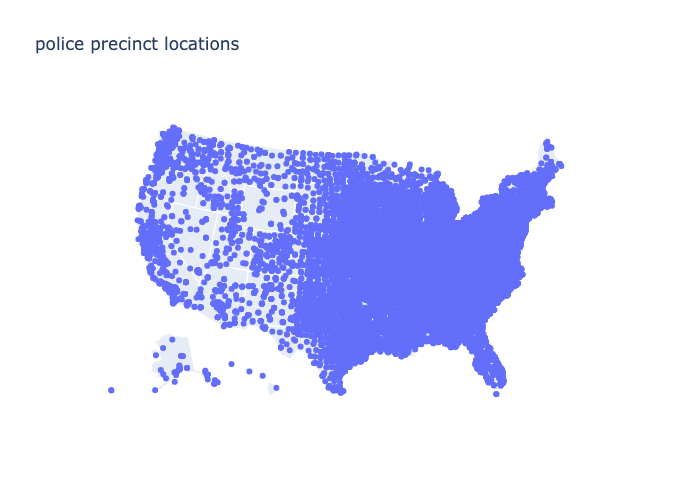

In [64]:
# Visualize locations of police agencies.
image = visualize_locations(crime_data, "police precinct locations")
image

### County-Level Population (Continuation of Crime Data)

The crime level data is helpful -- but we need to normalize that to per capita representations. I could say New York City and Broken Arrow, Oklahoma both have 1,000 crimes, but that doesn't mean much unless you consider the populations of those areas.

This will take a little bit of in-the-weeds work. I was able to find county-level 2022 population estimates, but my Zillow data only has zipcode. So, I'll need to find a way to map zipcodes to counties so I can then transform the crime data to be per capita representations.

In [65]:
# Read in zip-county mapping data.
zip_county_pairs = pd.read_csv('data/third_party_data/zipcode_county_map.csv')

In [66]:
"""
county_pop

Read in a dataset of county-level 2022 population estimates.

    args:
        None
    
    returns:
        a list of every county in the US's population estimate in 2022.
"""

def county_pop():
    
    # Empty list for results.
    pop_list = []
    
    # For each state,
    for state in tqdm(state_abbreviations.keys()):
        
        # Read in the data.
        pop = pd.read_excel(f'data/third_party_data/county_population/{state}.xlsx')
        
        # Drop irrelevant columns.
        pop.columns = ['area','base_estimates','2020_pop','2021_pop','2022_county_pop']
        
        # Drop header / footer of data that is just metadata on the DataFrame.
        pop = pop[4:-5]
        
        # Break area in 'state' and 'county'.
        pop['state'] = pop['area'].str.split(',').str[1].str.strip()
        pop['county'] = pop['area'].str.split(', ').str[0].str[1:].str.strip()
        
        # Drop the area column.
        pop = pop[['state','county','2022_county_pop']]
        
        # Append the state's data to the list of results.
        pop_list.append(pop)
        
    return pd.concat(pop_list)


In [67]:
# Read in population estimates for each county.
pop = county_pop()

#Peek at results.
pop.head()

100%|██████████| 50/50 [00:01<00:00, 36.91it/s]


,state,county,2022_county_pop
4,Alabama,Autauga County,59759.0
5,Alabama,Baldwin County,246435.0
6,Alabama,Barbour County,24706.0
7,Alabama,Bibb County,22005.0
8,Alabama,Blount County,59512.0


In [68]:
# Function

# Load in zip-county map data.
# Get all unique zip codes / lat / lngs from zillow data.
# Look up county, return it.
# If zip code -> county map is null, then find nearest zip code (lat/lnt euclidean dist). return county
# If zip code can't be found, find closest zip code (lat/lng euclidean dist). return county.

"""
county_lookup

For a specific Zillow listing's zipcode, return the county that best maps to it.

    args:
        zipcode: the Zillow listing's zipcode.
        latlng: a (latitude, longitude) tuple.
        df: the zipcode-county mapping dataset (read in several cells back).
    
    returns:
        The county and state the best matches the zipcode, and how the "distance" the match is in
        the case the exact zipcode couldn't be found.

"""

def county_lookup(zipcode, latlng, df=zip_county_pairs):
    
    # Make sure the zipcode data type is a string but preserves trailing zeros.
    zipcode = str(int(zipcode))
    
    # Attempt to filter for the zipcode in the zipcode-county mapping dataset.
    zipcode_data = df[df['zip']==zipcode]
    
    # If there was a match,
    if len(zipcode_data) == 1:
        
        # We're done! Return the county and state, distance = 0.
        return zipcode_data['county'], zipcode_data['state'], 0
    
    # If there wasn't a match.
    else:
        
        # Fetch the latitude and longtiude out of the tuple.
        lat, lng = latlng[0], latlng[1]
        
        # Calculate the distance between the latitude/longitude coordinates and all of the zip-county
        # mappings in the map dataset. This is a measure of straightline euclidean distance.
        df['distance'] = np.sqrt((df['latitude'] - lat)**2 + (df['longitude'] - lng)**2)
        
        # Find the record with the smallest distance.
        nearest_zipcode = df.loc[df['distance'].idxmin()]
        
        # Return the county, state, and the distance from the match.
        return nearest_zipcode['county'], nearest_zipcode['state'], nearest_zipcode['distance']


"""
zillow_county_finder

Iterate through all of the listings to find the county that best matches its location.

    args:
        listings: the DataFrame of listings
        
    returns:
        A new dataframe with the geographic information about the listing, including the county
        it is located in (or the nearest county it is located to).
"""  
    
def zillow_county_finder(listings):
    
    
    zid_list = []
    zip_list = []
    county_list = []
    state_list = []
    lat_list = []
    lng_list = []
    
    for i, row in tqdm(listings.iterrows(), total=len(listings)):
        
        zid = row['zillowId']
        zip_ = row['zipcode']
        lat = row['latitude']
        lng = row['longitude']
        latlng = (lat, lng)
        county, state, _ = county_lookup(zipcode=zip_, latlng=latlng)
        
        zid_list.append(zid)
        zip_list.append(zip_)
        county_list.append(county)
        state_list.append(state)
        lat_list.append(lat)
        lng_list.append(lng)
        
    
    # save results.
    county_state_df = pd.DataFrame(data={
        'zillowId': zid_list, 
        'zipcode': zip_list, 
        'county': county_list, 
        'state': state_list,
        'latitude': lat_list,
        'longitude': lng_list
    })
    
    
    return county_state_df

zillow_county_state_df = zillow_county_finder(listings)

100%|██████████| 214746/214746 [03:27<00:00, 1033.31it/s]


Now, with the county information, we can bridge together the estimated population for the county that the listing is in (or closest to). This will allow us to calculate per capita crime representations for the nearest police precinct using the population of the county associated with that listing.

In [69]:
# Change state name to two-letter code of state.
zillow_county_state_df['state'] = zillow_county_state_df['state'].replace(state_abbreviations)

# Merge population estimates onto the zillow_county_state_df.
zillow_county_state_df = zillow_county_state_df.merge(pop, on=['county','state'])

In [70]:
# Peek at the results.
zillow_county_state_df.head()

,zillowId,zipcode,county,state,latitude,longitude,2022_county_pop
0,2.091639e+09,98370.0,Kitsap County,Washington,47.762417,-122.545630,277673.0
1,2.056520e+09,98070.0,Kitsap County,Washington,47.494846,-122.461720,277673.0
2,4.879752e+07,98070.0,Kitsap County,Washington,47.473576,-122.485916,277673.0
3,2.085531e+09,98070.0,Kitsap County,Washington,47.494890,-122.461470,277673.0
4,9.669307e+07,98070.0,Kitsap County,Washington,47.475597,-122.448630,277673.0


### Building a point of interest map

Start here!

In [71]:
import random
import math

# Function

# read in all zillow records (lat/lngs).
# find for each attribute the nearest location from a euclidean distance (prison, starbucks, parks).


"""
haversine

The haversine formula computes the great-circle distance between two latitude/longitude coordinate points.

    args:
        lat1: the latitude of a listing.
        lng1: the longitude of a listing.
        lat2: the latitude of a police precinct.
        lng2: the longitude of a police precinct.
    
    returns:
        the great-cicle distance in miles between the two sets of coordinates.
"""

def haversine(lat1, lon1, lat2, lon2):
        
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(math.radians, [lat1, lon1, lat2, lon2])
    
    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    radius_earth = 3958.8  # Radius of the Earth in miles
    distance = radius_earth * c
    
    # Return distance.
    return distance

"""
nearest_point

For each listing, determine the nearest point of interest for each category (prisons, museums, et cetera)
as measured in miles. If looking for the nearest police precinct, return an expanded data set of crime data.

    args:
        lat: the latitude of the zillow listing.
        lng: the longitude of the zillow listing.
        df: the point of interest dataset being evaluated.
        crime: defaults to False. if True, it returns different data.
        
    returns:
        If crime==False, return the distance in miles to the nearest point of interest. If crime==True,
        return information about the count of crimes and value of stolen goods from the nearest police
        precinct.
"""

def nearest_point(lat, lng, df, crime=False):
    
    # if crime == False, return distance to nearest point of interest in miles.
    if crime==False:
        
        # Apply haversine distance from the zillow listing to all points of interest in the dataset.
        df['distance'] = df.apply(lambda row: haversine(lat, lng, row['latitude'], row['longitude']), axis=1)
        
        # Find the nearest one, and return its distance.
        distance_to_nearest = df.loc[df['distance'].idxmin()]['distance']
        return distance_to_nearest
    
    # if crime == True, returns crime data from nearest police precinct.
    elif crime == True:
        
        # Apply haversine distance from the zillow listing to all police precincts in the dataset.
        df['distance'] = df.apply(lambda row: haversine(lat, lng, row['latitude'], row['longitude']), axis=1)
        
        # Get the index value for the nearest police precinct.
        index = df.iloc[df['distance'].idxmin()].name        
        
        # Get crime data from that index.
        most_serious = df.iloc[index]['most_serious']
        serious = df.iloc[index]['serious']
        less_serious = df.iloc[index]['less_serious']
        total_stolen_value = df.iloc[index]['total_stolen_value']
        
        # Return crime data.
        return most_serious, serious, less_serious, total_stolen_value

"""
triangulate_data

Orchestrate measuring all points of interest categories for a given zillow listing.

    args:
        row: a row in DataFrame.iterrows():
    
    returns:
        A single row DataFrame with all the points of interest.

"""    
    

def triangulate_data(row):
    
    # Extract latitude / longitude coordinates for the listing, as well as the zillow ID.
    lat = row['latitude']
    lng = row['longitude']
    zillowId = row['zillowId']
    
    # Fetch nearest national park.
    nearest_national_park = nearest_point(lat, lng, national_parks)
    
    # Fetch nearest post office.
    nearest_post_office = nearest_point(lat, lng, post_offices)
    
    # Fetch nearest museums (tiny, small, medium, large, massive).
    nearest_tiny_museum = nearest_point(lat, lng, museums[museums['revenue_tier']=='tiny'].copy())
    nearest_small_museum = nearest_point(lat, lng, museums[museums['revenue_tier']=='small'].copy())
    nearest_medium_museum = nearest_point(lat, lng, museums[museums['revenue_tier']=='medium'].copy())
    nearest_large_museum = nearest_point(lat, lng, museums[museums['revenue_tier']=='large'].copy())
    nearest_massive_museum = nearest_point(lat, lng, museums[museums['revenue_tier']=='massive'].copy())
    
    # Fetch nearest Alltrail (Top Trail, Hidden Gem, Tough to Love, Under the Radar).
    nearest_top_trail = nearest_point(lat, lng, trail_data[trail_data['trail_type']=='Top Trail'].copy())
    nearest_hidden_gem_trail = nearest_point(lat, lng, trail_data[trail_data['trail_type']=='Hidden Gem'].copy())
    nearest_tough_to_love_trail = nearest_point(lat, lng, trail_data[trail_data['trail_type']=='Tough to Love'].copy())
    nearest_under_the_radar_trail = nearest_point(lat, lng, trail_data[trail_data['trail_type']=='Under the Radar'].copy())
    
    # Fetch nearest prison.
    nearest_prison = nearest_point(lat, lng, prisons)
    
    # Fetch nearest power plant (clean, dirty).
    nearest_clean_power_plant = nearest_point(lat, lng, power_plants[power_plants['fuel_type']=='clean'].copy())
    nearest_dirty_power_plant = nearest_point(lat, lng, power_plants[power_plants['fuel_type']=='dirty'].copy())
    
    # Fetch nearest police station.
    nearest_police_station = nearest_point(lat, lng, crime_data)
    
    # Fetch expanded crime data from the nearest police station.
    most_serious, serious, less_serious, total_stolen_value = nearest_point(lat, lng, crime_data, crime=True)
    
    # normalize crime data to the population estimate for the county associated with that zillow listing.
    most_serious_per_capita = most_serious / row['2022_county_pop'] * 1000
    serious_per_capita = serious / row['2022_county_pop'] * 1000
    less_serious_per_capita = less_serious / row['2022_county_pop'] * 1000
    total_stolen_value_per_capita = total_stolen_value / row['2022_county_pop'] * 1000
    
    # Return a single row DataFrame with all the data.
    return pd.DataFrame(data={
        'zillowId': zillowId,
        'national_park': nearest_national_park,
        'post_office': nearest_post_office,
        'tiny_museum': nearest_tiny_museum,
        'small_museum': nearest_small_museum,
        'medium_museum': nearest_medium_museum,
        'large_museum': nearest_large_museum,
        'massive_museum': nearest_massive_museum,
        'top_trail': nearest_top_trail,
        'hidden_gem_trail':nearest_hidden_gem_trail,
        'tougth_to_love_trail':nearest_tough_to_love_trail,
        'under_the_radar_trail':nearest_under_the_radar_trail,
        'prison': nearest_prison,
        'clean_power_plant': nearest_clean_power_plant,
        'dirty_power_plant': nearest_dirty_power_plant,
        'police_station': nearest_police_station,
        'most_serious_crimes_per_capita':most_serious_per_capita,
        'serious_crimes_per_capita':serious_per_capita,
        'less_serious_crimes_per_capita':less_serious_per_capita,
        'total_stolen_value_per_capita':total_stolen_value  
    },index=[0])

In [72]:
"""
generate_poi_data

Wrapper function to manage fetching points of interest data for every zillow listing.

    args:
        existing_data: if False, run the whole function (takes 4~ days to handle th 200,000~ listings). 
        If True, just read in thedata that's already been processed!

    returns:
        A DataFrame with the full points of interest dataset for every Zillow listing.

"""


def generate_poi_data(existing_data=False):
    
    # If existing data==False, run the function.
    if existing_data == False:
        
        # Empty list.
        poi_list = []
        
        # For each listing in the DataFrame,
        for i, row in tqdm(zillow_county_state_df.iterrows(), total=len(zillow_county_state_df), desc="Building points of interest map..."):
            
            # Triangulate all points of interest.
            poi = triangulate_data(row)
            
            # Append to the list
            poi_list.append(poi)
        
        # Concatenate all of the DataFrames.
        poi_data = pd.concat(poi_list)
        
        # merge county/state/population data.
        full_poi_data = poi_data.merge(zillow_county_state_df, how='left',on='zillowId')
        
        # Save the data.
        full_poi_data.to_csv('data/backup/BACKUP points_of_interest_data.csv')
        
        # Return the data.
        return full_poi_data
    
    # If true -- skip all of that!
    elif existing_data == True:
        
        # Read the already processed data.
        full_poi_data = pd.read_csv('data/backup/BACKUP points_of_interest_data.csv')
        
        # Return the data.
        return full_poi_data
                                    
        

In [73]:
# Generate full points of interest dataset.
full_poi_data = generate_poi_data(existing_data=True)

In [74]:
full_poi_data.head()

,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,zillowId,national_park,post_office,tiny_museum,small_museum,medium_museum,...,lightningAnnualizedFrequency,riverineFloodingAnnualizedFrequency,strongWindAnnualizedFrequency,tornadoAnnualizedFrequency,tsunamiAnnualizedFrequency,volcanicActivityAnnualizedFrequency,wildFireAnnualizedActivity,winterWeatherAnnualizedFrequency,comps_x,comps_y
0,0,0,0,0,2.091639e+09,72.027601,1.379914,2.083139,3.771063,10.751508,...,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,2382000.0,190080.0
1,1,1,1,1,2.056520e+09,54.730437,2.205721,3.292446,9.167639,7.824371,...,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,2397400.0,1646950.0
2,2,2,2,2,4.879752e+07,54.340696,2.259702,2.048503,10.549123,9.315314,...,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,1358600.0,754000.0
3,3,3,3,3,2.085531e+09,54.725388,2.213816,3.296159,9.156786,7.812322,...,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,2397400.0,1646950.0
4,4,4,4,4,9.669307e+07,53.315705,2.198448,2.113255,9.668172,7.640726,...,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,2145600.0,246790.0


### Visualizing the points of interest

Let's take a look at what this dataset looks like for a given listing. 

In [75]:
"""
visualize_points_of_interest

Create a radar chart that shows the points of interest distribution for a given zillow listing.

    args:
        data: one zillow listing's point of interest data.
        
    returns:
        A visualization of the points of interest data.
"""

def visualize_points_of_interest(data):
    
    # Convert to dictionary.
    data = data.to_dict()
    
    # Columns to exclude.
    crimes = ['police_station', 'most_serious_crimes_per_capita',
               'serious_crimes_per_capita','less_serious_crimes_per_capita',
               'total_stolen_value_per_capita']
    
    exclude = ['police_station', 'most_serious_crimes_per_capita',
               'serious_crimes_per_capita','less_serious_crimes_per_capita',
               'total_stolen_value_per_capita','2022_county_pop','state','county','latitude','longitude',
              'zipcode','zillowId','Unnamed: 0']
    
    # Exclude columns.
    nearest_points = {key: value for key, value in data.items() if key not in exclude}
    
    # Break apart dictionary into categories and values.
    categories = list(nearest_points.keys())
    values = list(nearest_points.values())

    # Generate random angles for each category
    angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()

    # Close the plot
    values += values[:1]
    angles += angles[:1]
    
    # Create plot.
    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

    # Edit the plot.
    ax.fill(angles, values, color='skyblue', alpha=0.6)
    ax.plot(angles, values, color='blue', linewidth=2)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=10)
    
    # Get per capita crimes.
    per_capita_crimes = {key: value for key, value in data.items() if key in crimes}
    
    # Show plot
    plt.show()
    
    # Print per capita crimes.
    print(per_capita_crimes)

In [76]:
full_poi_data['total_stolen_value_per_capita'] = full_poi_data['total_stolen_value_per_capita'].fillna(0)

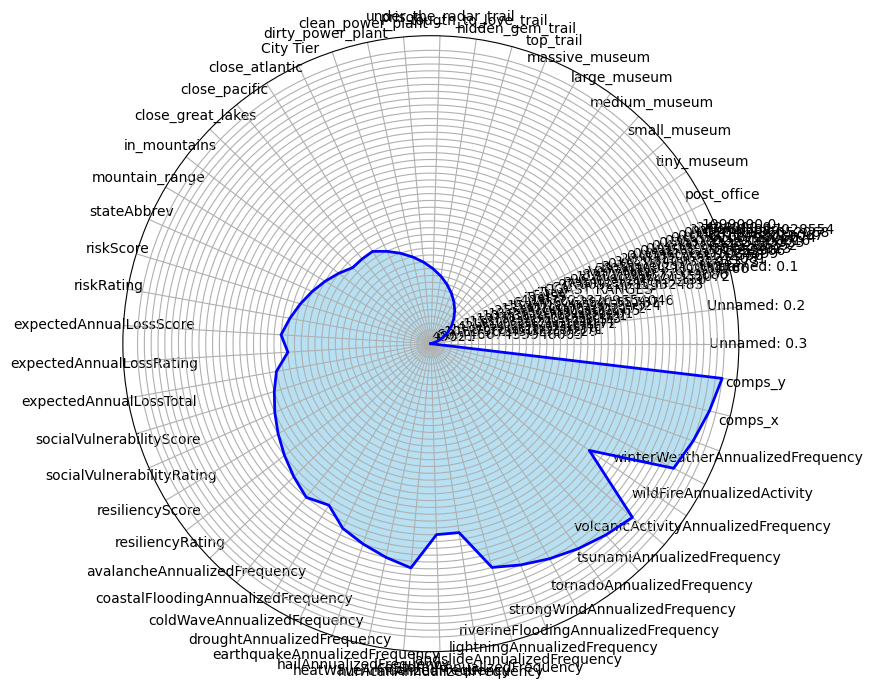

{'police_station': 42.02356658564143, 'most_serious_crimes_per_capita': 0.0, 'serious_crimes_per_capita': 0.0, 'less_serious_crimes_per_capita': 0.0, 'total_stolen_value_per_capita': 37802.0}


In [77]:
visualize_points_of_interest(data=full_poi_data.iloc[49021])

## Addendum: Additional data

These were data that I chased down after going through early revisions of the model performance evaluation.

- Close to major city (categories).
- Close to beach.
- In mountainous range.
- In natural disaster area.
- Price of similar homes nearby.

### Close to major city (categories).

Certain markets are more expensive if you live in them. The example that comes to mind for many people is New York City: a 1,000 sqft listing is not going to cost the same there as 50 miles north of the city. But there are a lot of cities that command higher home prices due to being centers of commercial, culture, or political power.

I'll categorize cities using a slightly modified version of the Ranally City Rating System. This will allow me to bucket listings into tiers based on whether or not they fall into a major metropolitan market.

Source: https://en.wikipedia.org/wiki/Ranally_city_rating_system

In [78]:
# The largest metroplitan city areas.
tier1 = [
    ('New York', 'NY', 40.7128, -74.0060),('Brooklyn', 'NY', 40.7128, -74.0060),
    ('Queens', 'NY', 40.7128, -74.0060),('Chicago', 'IL', 41.8781, -87.6298),
    ('Los Angeles', 'CA', 34.0522, -118.2437),('San Francisco', 'CA', 37.7749, -122.4194),
]

# Major national business centers.
tier2 = [
    ('Atlanta', 'GA', 33.7490, -84.3880),('Boston', 'MA', 42.3601, -71.0589),
    ('Dallas', 'TX', 32.7767, -96.7970),('Houston', 'TX', 29.7604, -95.3698),
    ('Miami', 'FL', 25.7617, -80.1918),('Philadelphia', 'PA', 39.9526, -75.1652),
    ('Washington D.C.', 'DC', 38.9072, -77.0369),
]

# Other national centers.
tier3 = [
    ('Cleveland', 'OH', 41.4993, -81.6944),('Cincinnati', 'OH', 39.1031, -84.5120),
    ('Denver', 'CO', 39.7392, -104.9903),('Pittsburgh', 'PA', 40.4406, -79.9959),
    ('New Orleans', 'LA', 29.9511, -90.0715),('Phoenix', 'AZ', 33.4484, -112.0740),
    ('Portland', 'OR', 45.5152, -122.6784),('Seattle', 'WA', 47.6062, -122.3321),
    ('Kansas City', 'MO', 39.0997, -94.5786),('St. Louis', 'MO', 38.6270, -90.1994),
    ('Indianapolis', 'IN', 39.7684, -86.1581),
]

# Major regional centers.
tier4 = [
    ('Oklahoma City', 'OK', 35.4676, -97.5164),('Albany', 'NY', 42.6526, -73.7562),
    ('Albuquerque', 'NM', 35.0844, -106.6504),('Austin', 'TX', 30.2672, -97.7431),
    ('Baton Rouge', 'LA', 30.4515, -91.1871),('Birmingham', 'AL', 33.5186, -86.8104),
    ('Buffalo', 'NY', 42.8864, -78.8784),('Charlotte', 'NC', 35.2271, -80.8431),
    ('Columbia', 'SC', 34.0007, -81.0348),('Dayton', 'OH', 39.7589, -84.1916),
    ('Des Moines', 'IA', 41.5868, -93.6250),('El Paso', 'TX', 31.7619, -106.4850),
    ('Grand Rapids', 'MI', 42.9634, -85.6681),('Harrisburg', 'PA', 40.2732, -76.8867),
    ('Hartford', 'CT', 41.7658, -72.6734),('Honolulu', 'HI', 21.3069, -157.8583),
    ('Jackson', 'MS', 32.2988, -90.1848),('Jacksonville', 'FL', 30.3322, -81.6557),
    ('Knoxville', 'TN', 35.9606, -83.9207),('Las Vegas', 'NV', 36.1699, -115.1398),
    ('Lexington', 'KY', 38.0406, -84.5037),('Little Rock', 'AR', 34.7465, -92.2896),
    ('Louisville', 'KY', 38.2527, -85.7585),('Madison', 'WI', 43.0731, -89.4012),
    ('Memphis', 'TN', 35.1495, -90.0490),('Nashville', 'TN', 36.1627, -86.7816),
    ('New Haven', 'CT', 41.3083, -72.9279),('Norfolk', 'VA', 36.8508, -76.2859),
    ('Omaha', 'NE', 41.2565, -95.9345),('Orlando', 'FL', 28.5383, -81.3792),
    ('Peoria', 'IL', 40.6936, -89.5890),('Providence', 'RI', 41.8240, -71.4128),
    ('Raleigh', 'NC', 35.7796, -78.6382),('Richmond', 'VA', 37.5407, -77.4360),
    ('Rochester', 'NY', 43.1566, -77.6088),('Sacramento', 'CA', 38.5816, -121.4944),
    ('Salt Lake City', 'UT', 40.7608, -111.8910),('Shreveport', 'LA', 32.5252, -93.7502),
    ('Spokane', 'WA', 47.6588, -117.4260),('Springfield', 'MO', 37.2089, -93.2923),
    ('Syracuse', 'NY', 43.0481, -76.1474),('Tampa', 'FL', 27.9506, -82.4572),
    ('Toledo', 'OH', 41.6528, -83.5379),('Tucson', 'AZ', 32.2226, -110.9747),
    ('Tulsa', 'OK', 36.1539, -95.9928),('West Palm Beach', 'FL', 26.7153, -80.0534),
    ('Wichita', 'KS', 37.6872, -97.3301),
]


I'll creating a `listings_dict` dictionary that will store all of the zillowIds that are related to a given city state in our tiers. I'll then loop through to categorize cities by looking up zillowIds in the `listing_dict` if they are in one of the tiered cities.

In [79]:
# Preprocess listings DataFrame for faster lookup
listings_dict = {}
for tier in [tier1, tier2, tier3, tier4]:
    for city, state, lat, lon in tier:
        listings_dict[(city, state)] = set()

# Iterate through full_poi_data to populate listings_dict with zillowId
for i, row in tqdm(listings.iterrows(), total=len(full_poi_data), desc="Populating listings_dict..."):
        
    state = row['state']
    zillowId = row['zillowId']
    city = row['city']

    if (city, state) in listings_dict:
        listings_dict[(city, state)].add(zillowId)


# Define city_tier function to determine the tier of a given zillowId
def city_tier(zillowId):
    for (city, state), zillow_ids in listings_dict.items():
        if zillowId in zillow_ids:
            
            if city in [x for x,_,_,_ in tier1]:
                return 'Tier 1'
            elif city in [x for x,_,_,_ in tier2]:
                return 'Tier 2'
            elif city in [x for x,_,_,_ in tier3]:
                return 'Tier 3'
            elif city in [x for x,_,_,_ in tier4]:
                return 'Tier 4'            
    return 'Tier 5'

# Iterate through full_poi_data to categorize cities into tiers
tiers = []
for i, row in tqdm(full_poi_data.iterrows(), total=len(full_poi_data), desc="Categorizing cities..."):
    zillowId = row['zillowId']
    tier = city_tier(zillowId)
    tiers.append(tier)

# Add the 'City Tier' column to full_poi_data DataFrame
full_poi_data['City Tier'] = tiers


Categorizing cities...: 100%|██████████| 218700/218700 [00:07<00:00, 30574.32it/s]


Based on a quick visual check, it looks like the tiering is having the expected results. The tier 1 cities (New York, Chicago, Los Angeles, San Francisco) are all showing up in the correct locations!

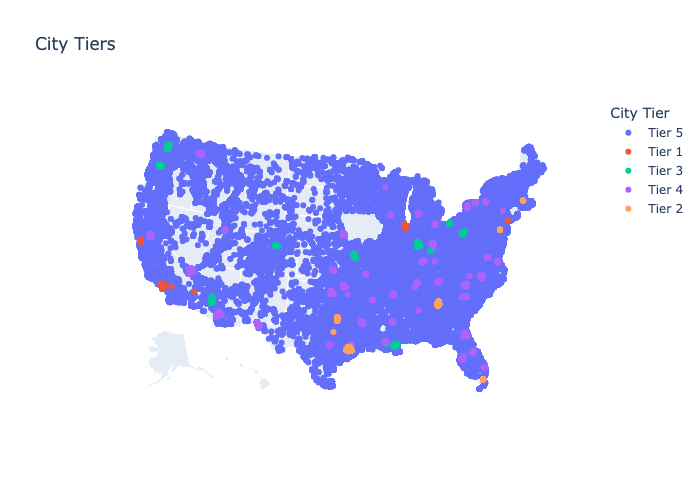

In [80]:
visualize_locations(full_poi_data,'City Tiers',color='City Tier')

In [81]:
# Quick check to see how many cities were tiered, vs untiered ("Tier 5").
full_poi_data[['City Tier']].groupby('City Tier').size()

City Tier
Tier 1      2665
Tier 2      3027
Tier 3      3779
Tier 4      6869
Tier 5    202360
dtype: int64

In [82]:
# Save the full_poi_data now that we've added the city data.
full_poi_data.to_csv('data/backup/BACKUP points_of_interest_data.csv')

### Close to beach

While Zillow homes have metadata about oceanfront or beach front views, this doesn't really capture the effect that living near the beach has on a listing's price.

I want to know if a listing is within 5 miles of the coast. I'll broadly define the coast as the Pacific Ocean, the Atlantic Ocean, and the Great Lakes (not an ocean, but a major coastline for the continental United States).

To do this I'll need to:

* Create a representation of the each of these coasts.
* Check for each listing whether or not they are 5 or less miles from any points in each coast representation.


First, I'll define a function that can read in .shp files. I'm using US govenrment resources to get these coast representations.
* Atlantic and Great Lakes: https://catalog.data.gov/dataset/tiger-line-shapefile-2019-nation-u-s-coastline-national-shapefile
* Pacific Lakes:  https://shoreline.noaa.gov/data/datasheets/medres.html

In [83]:
# Define a function for reading in shp files into a geojson representation.

def shp_to_geojson(shp_file_path, geojson_file_path):
    """
    Convert a shapefile to a GeoJSON file.

    Args:
        shp_file_path (str): The path to the input shapefile.
        geojson_file_path (str): The path to the output GeoJSON file.
    """
    # Open the shapefile
    with fiona.open(shp_file_path, 'r') as shapefile:
        # Get the schema of the shapefile
        schema = shapefile.schema
        # Convert the CRS to a string representation
        crs = to_string(shapefile.crs)
        
        # Initialize an empty list to store the features
        features = []

        # Iterate over the features in the shapefile
        for feature in shapefile:
            features.append(feature)
        
        # Create a GeoJSON FeatureCollection
        feature_collection = {
            "type": "FeatureCollection",
            "crs": {
                "type": "name",
                "properties": {
                    "name": crs
                }
            },
            "features": features
        }

        # Write the FeatureCollection to a GeoJSON file
        with open(geojson_file_path, 'w') as geojson_file:
            geojson.dump(feature_collection, geojson_file, indent=2)

Let's use the function to read in the two .shp files as geojson data structures.

In [84]:
# Atlantic Ocean coastline and Great Lakes coastline.
shp_file_path = 'data/third_party_data/us_coastline_2019.shp'
geojson_file_path = 'data/third_party_data/us_coastline_2019.geojson'
shp_to_geojson(shp_file_path, geojson_file_path)

with open(geojson_file_path) as f:
    atlantic_gj = geojson.load(f)

<ipython-input-84-6cd76182126c>:4: FionaDeprecationWarning:

This function will be removed in version 2.0. Please use CRS.to_string() instead.



In [85]:
# Pacific Ocean coastline
shp_file_path = 'data/third_party_data/us_medium_shoreline.shp'
geojson_file_path = 'data/third_party_data/us_medium_shoreline.geojson'
shp_to_geojson(shp_file_path, geojson_file_path)

with open(geojson_file_path) as f:
    us_gj = geojson.load(f)

<ipython-input-85-bc5ba0298290>:4: FionaDeprecationWarning:

This function will be removed in version 2.0. Please use CRS.to_string() instead.



I'll now get the coordinate data I need out of each of these to build my coastline representations.

In [86]:
def extract_atlantic_lat_lngs(geojson_data, names):
    """
    Extracts all latitude and longitude pairs from a GeoJSON structure.
    
    Args:
        geojson_data (dict): The GeoJSON data.
        
    Returns:
        list: A list of tuples where each tuple contains a latitude and longitude pair.
    """
    lat_lngs = []

    for feature in geojson_data['features']:
        if feature['properties']['NAME'] in names:
            coords = feature['geometry']['coordinates']
            for coord in coords:
                lat_lngs.append((coord[1], coord[0]))  # (lat, lng)

    return lat_lngs

def extract_pacific_lat_lngs(geojson_data, names):
    """
    Extracts all latitude and longitude pairs from a GeoJSON structure.
    
    Args:
        geojson_data (dict): The GeoJSON data.
        
    Returns:
        list: A list of tuples where each tuple contains a latitude and longitude pair.
    """
    lat_lngs = []
    
    for feature in geojson_data:
        if 'properties' in feature and feature['properties']['REGIONS'] in names:
            coords = feature['geometry']['coordinates']
            for coord in coords:
                lat_lngs.append((coord[1], coord[0]))  # (lat, lng)
    
    return lat_lngs
    
    

def plot_lat_lngs(lat_lngs_list):
    """
    Plots latitude and longitude pairs as a line using Matplotlib.
    
    Args:
        lat_lngs (list): A list of tuples where each tuple contains a latitude and longitude pair.
        
    Returns:
        Renders a Matplotlib plot of the latitude / longitude coordinates.
    """
    
    for lat_lngs in lat_lngs_list:
        lats, lngs = zip(*lat_lngs)
        plt.scatter(lngs, lats, marker='o',s=5)
        
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Line Plot of Lat/Lng Points')
    plt.axis('equal')

    plt.show()

In [88]:
# Atlantic coast.
atlantic_lat_lngs = extract_atlantic_lat_lngs(atlantic_gj, names=['Atlantic','AtlÃ¡ntico','Gulf','Carribean','Caribe'])

In [89]:
# Great Lakes coast.
great_lakes_lat_lngs = extract_atlantic_lat_lngs(atlantic_gj, names=['Great Lakes'])

In [90]:
# Pacific coast.
pacific_lat_lngs = extract_pacific_lat_lngs(us_gj['features'], names=['P'])

Success! This looks like a pretty good representation of the 3 coastlines.

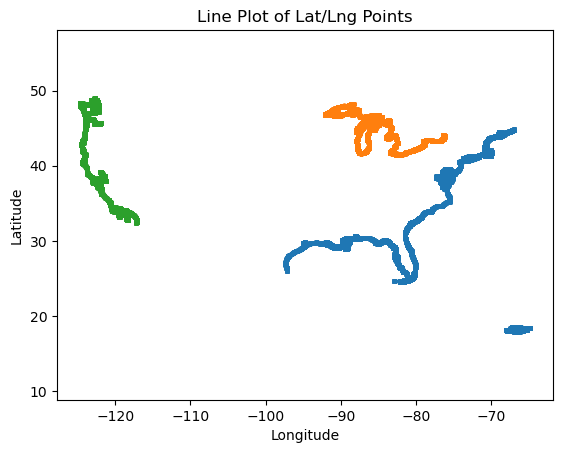

In [91]:
# Visualize all three coasts.
plot_lat_lngs([atlantic_lat_lngs, great_lakes_lat_lngs, pacific_lat_lngs])

Now, I'll create a function that can check whether or not a listing is within 5 miles of a given coastline. This reuses the `haversine` function defined earlier in this notebook to measure the distance in miles between two coordinate sets.

In [92]:
def is_within_5_miles_of_coast(lat, lng, coastline):
    """
    Check if a given latitude/longitude coordinate is within 5 miles of a predefined line along the Atlantic Ocean.

    Args:
        lat (float): Latitude of the point to check.
        lng (float): Longitude of the point to check.
        coastline (list of tuple): List of (latitude, longitude) tuples defining the coastline.

    Returns:
        bool: True if the point is within 5 miles of the line, False otherwise.
    """
    
    # For each coordinate set in the coastline dataset.
    for coastline_lat, coastline_lng in coastline:
        # Calculate the distance.
        distance = haversine(coastline_lat, coastline_lng, lat, lng)
        # If the distance is less than or equal to 5 miles, return True.
        if distance <= 5:
            return True
    # If the distance is greater than 5 miles, return False.
    return False


Here are a few quick test cases to make sure this works as expected.

In [93]:
# a lat/lng near the Pacific.
lat = 36.615299
lng = -121.944098
print(is_within_5_miles_of_coast(lat, lng, atlantic_lat_lngs))
print(is_within_5_miles_of_coast(lat, lng, great_lakes_lat_lngs))
print(is_within_5_miles_of_coast(lat, lng, pacific_lat_lngs))

False
False
True


In [94]:
# a lat/lng near the Atlantic.
lat = 35.012396
lng = -76.302899
print(is_within_5_miles_of_coast(lat, lng, atlantic_lat_lngs))
print(is_within_5_miles_of_coast(lat, lng, great_lakes_lat_lngs))
print(is_within_5_miles_of_coast(lat, lng, pacific_lat_lngs))

False
False
False


In [95]:
# a lat/lng near the Great Lakes.
lat = 46.724892
lng = -92.044664
print(is_within_5_miles_of_coast(lat, lng, atlantic_lat_lngs))
print(is_within_5_miles_of_coast(lat, lng, great_lakes_lat_lngs))
print(is_within_5_miles_of_coast(lat, lng, pacific_lat_lngs))

False
True
False


Now we'll bring it altogether and check for each listing whether or not it is within 5 miles of a coast. There is a few things I'll do to try and make this efficient (since the coastline datasets are fairly high detail, it takes 24+ hours to check all 200,000 listings):

* Once there is a match on one coastline, don't attempt to check the other coasts. If you are near the Pacific, you can't be near the Atlantic or Great Lakes!
* I check Pacific first, Atlantic second, Great Lakes third. Based on the distribution of data, this should limit the number of times we have to check all three coastlines to find a match.
* I've defined a polygon called `us_inland_coords` that represents the area of the US  we definitely shouldn't be checking (think Oklahoma, Tennessee, Iowa). This will allow us to save computing time by skipping listings who fall inside this shape.

In [96]:
# Rough shape for the inland of the US.
us_inland_coords = [
    (25.498162, -80.728631),(27.008848, -80.490373),(30.312132, -81.799476),(31.855057, -81.597037),
    (32.563027, -81.212404),(34.291847, -78.756150),(35.068710, -77.501031),(37.161739, -77.460543),
    (38.641878, -78.317533),(39.841773, -76.981194),(40.893966, -74.491422),(41.312282, -73.587947),
    (41.719807, -71.966046),(43.205292, -71.204079),(44.106623, -70.173235),(44.291882, -69.474881),
    (44.668346, -69.082022),(44.950389, -67.419605),(45.439779, -67.150574),(47.683517, -67.606443),
    (50.736243, -91.100409),(50.448242, -111.223621),(49.320835, -121.042192),(47.667513, -121.495856),
    (42.740464, -123.180891),(37.001206, -121.074597),(33.374216, -116.375941),(32.339856, -115.112164),
    (28.882548, -106.071301),(25.861552, -98.456238),(27.913391, -98.294215),(29.476681, -96.317539),
    (30.487116, -94.146436),(30.773646, -90.840021),(30.997940, -88.278724),(30.571333, -85.299257),
    (30.300925, -83.469760),(29.257469, -82.581147),(27.404305, -82.090450),(25.498162, -80.728631)
]

# Converting coords into a Polygon.
polygon = Polygon([(lng, lat) for lat, lng in us_inland_coords])


def is_point_in_polygon(lat, lng, polygon=polygon):
    """
    Check if a point is inside a polygon.

    Args:
        lat (float): Latitude of the point to check.
        lng (float): Longitude of the point to check.
        polygon_coords (list of tuples): List of (latitude, longitude) tuples defining the polygon.

    Returns:
        bool: True if the point is inside the polygon, False otherwise.
    """
    point = Point(lng, lat)
    return polygon.contains(point)


def ocean_closeness(existing_data=False):
    
    """
    Leveraging is_point_in_polygon and is_within_5_miles_of_coast, iterate as efficiently
    as possible through the listings to calculate if they are close to the Atlantic, the Pacific,
    or the Great Lakes.
    
    Once a listing has been detected as close to one of these bodies of waters, it doesn't attempt to
    calculate for the other two (you can't be less than 5 miles away from two oceans at the same time).
    
    If the listing is inside of a roughly defined polygon of the us inland, it won't even attempt
    to calculate it to save time.
    
    Args:
        existing_data: if False, run the function. If True, skip.
    
    Returns:
        Three python lists of booleans for less than 5 miles to each of the oceans. These are saved to
        the points of interest dataset and exported into a csv.
    """
    
    if existing_data == False:
        
        # Empty lists for storing the values.
        close_atlantic = []
        close_pacific = []
        close_great_lakes = []
        
        # Loop through the dataframe.
        for i, row in tqdm(full_poi_data.iterrows(), total=len(full_poi_data), desc="detecting listings close to ocean..."):
            lat = row['latitude']
            lng = row['longitude']
            
            # Assume the listing is close to no oceans.
            atlantic = False
            pacific = False
            great_lakes = False
            
            # True loop that is broken as soon as a condition is met.
            while True:
                
                # Is the listing inland? Break, do nothing.
                if is_point_in_polygon(lat, lng):
                    break
                
                # Check: is this close to the Pacific? If yes, break.
                pacific = is_within_5_miles_of_coast(lat, lng, pacific_lat_lngs)
                if pacific == True:
                    break
                
                # Check: is this close to the Atlantic? If yes, break.
                atlantic = is_within_5_miles_of_coast(lat, lng, atlantic_lat_lngs)
                if atlantic == True:
                    break
                
                # Check: is this close to the Great Lakes? If yes, break.
                great_lakes = is_within_5_miles_of_coast(lat, lng, great_lakes_lat_lngs)
                if great_lakes == True:
                    break
                
                # If it is close to none of the oceans and not in the rough inland shape,
                # do nothing and break.
                if atlantic == False and pacific == False and great_lakes == False:
                    break
            
            # Append the values. These will all be False if no oceans were found. If an ocean
            # was found, then one of these will be True.
            close_atlantic.append(atlantic)
            close_pacific.append(pacific)
            close_great_lakes.append(great_lakes)

        # Save as new columns in the DataFrame.
        full_poi_data['close_atlantic'] = close_atlantic
        full_poi_data['close_pacific'] = close_pacific
        full_poi_data['close_great_lakes'] = close_great_lakes
        
        # Save the data.
        full_poi_data.to_csv('data/backup/BACKUP points_of_interest_data.csv')
    
    # If existing_data == True, we've already collected this information. Don't rerun the operation!
    elif existing_data == True:
        pass

In [100]:
ocean_closeness(existing_data=True)

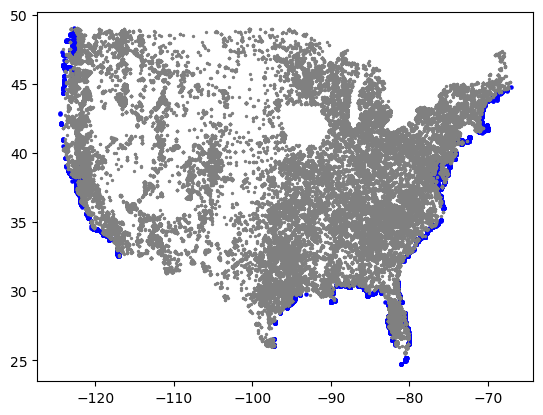

In [101]:
# Visualize data for the oceans. Either use plotly function to look at them one at a time,
# or do matplotlib.

atlantic_data = full_poi_data[full_poi_data['close_atlantic']==True]
pacific_data = full_poi_data[full_poi_data['close_pacific']==True]
great_lakes_data = full_poi_data[full_poi_data['close_great_lakes']==True]
other_data = full_poi_data[(full_poi_data['close_atlantic']==False)&(full_poi_data['close_pacific']==False)&(full_poi_data['close_great_lakes']==False)]


plt.scatter(atlantic_data['longitude'], atlantic_data['latitude'], s=5, c='b')
plt.scatter(pacific_data['longitude'], pacific_data['latitude'], s=5, c='b')

plt.scatter(great_lakes_data['longitude'], great_lakes_data['latitude'], s=5, c='b')
plt.scatter(other_data['longitude'], other_data['latitude'], s=2, c='grey')


plt.show()

### US Mountain Ranges

Living close to the mountains is definitely a premium "location, location, location" feature. While some of this has been captured by the National Parks, there are plenty of great homes enjoying a premium on home prices in the mountains that aren't close to National Parks.

Using data available from Arcgis, I'll check to see which listings are inside each of the major mountain ranges in the United States.

In [102]:
#source: https://hub.arcgis.com/datasets/fc949de03499477592fc412bb957720e/explore?location=37.431234%2C-82.777653%2C5.15

# US Mountain ranges.
shp_file_path = 'data/third_party_data/Landscape_-_U.S._Mountain_Ranges.shp'
geojson_file_path = 'data/third_party_data/US_Mountain_Ranges.geojson'
shp_to_geojson(shp_file_path, geojson_file_path)

with open(geojson_file_path) as f:
    mountains_gj = geojson.load(f)

<ipython-input-102-f5be94f01b54>:6: FionaDeprecationWarning:

This function will be removed in version 2.0. Please use CRS.to_string() instead.



In [103]:
# Create polygon and name data.
range_names_and_polygons = []


for i in range(19):
    mountain_range = mountains_gj[i]
    coordinates = mountain_range['geometry']['coordinates'][0]
    range_name = mountain_range['properties']['Name']
    
    # Ignore Alaskan ranges
    if range_name in ['BROOKS RANGE','ALASKA RANGE','Wrangell Mts.','CHUGACH MTS.']:
        continue
    else:
        polygon = Polygon([(lng, lat) for lng, lat in coordinates])
        range_names_and_polygons.append([range_name, polygon])

In [104]:
def in_mountains(lat, lng, polygons=range_names_and_polygons):
    
    for name, polygon in range_names_and_polygons:
        in_mountain = is_point_in_polygon(lat, lng, polygon)
        
        if in_mountain == True:
            return True, name
    
    return False, None

In [105]:
def check_in_mountains(existing_data=False):
    
    if existing_data==False:
    
        is_in_mountains_list = []
        mountain_range_list = []

        for i, row in tqdm(full_poi_data.iterrows(), total=len(full_poi_data), desc='checking if listing is in mountains...'):

            lat = row['latitude']
            lng = row['longitude']

            is_in_mountains, mountain_range = in_mountains(lat, lng)

            is_in_mountains_list.append(is_in_mountains)
            mountain_range_list.append(mountain_range)
        
         # Save as new columns in the DataFrame.
        full_poi_data['in_mountains'] = is_in_mountains_list
        full_poi_data['mountain_range'] = mountain_range_list
        
        # Save the data.
        full_poi_data.to_csv('data/backup/BACKUP points_of_interest_data.csv')
    
    # If existing_data == True, we've already collected this information. Don't rerun the operation!
    elif existing_data==True:
        pass

In [106]:
check_in_mountains(existing_data=True)

In [107]:
len(full_poi_data[full_poi_data['in_mountains']==True])

61956

In [108]:
full_poi_data.groupby('mountain_range').size().reset_index().sort_values(by=0, ascending=False)

,mountain_range,0
0,APPALACHIAN MTS.,25816
11,ROCKY MOUNTAINS,9103
6,COAST RANGES,7526
4,Blue Ridge,4927
5,CASCADE RANGE,4420
12,SIERRA NEVADA,3526
10,Ouachita Mts.,2050
7,Front Range,932
2,Bitterroot Range,909
14,Wasatch Range,823


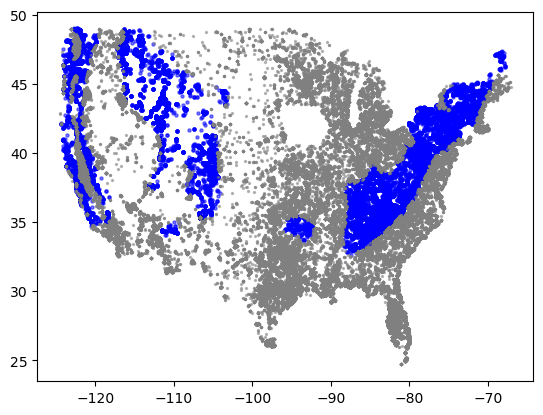

In [109]:
# Visualize data for the oceans. Either use plotly function to look at them one at a time,
# or do matplotlib.

mountains_data = full_poi_data[full_poi_data['in_mountains']==True]
other_data = full_poi_data[full_poi_data['in_mountains']==False]


plt.scatter(mountains_data['longitude'], mountains_data['latitude'], s=5, c='b',alpha=.5)
plt.scatter(other_data['longitude'], other_data['latitude'], s=2, c='grey',alpha=.5)

plt.show()

### Natural Disaster datasets

National Risk Index.

source: https://hazards.fema.gov/nri/data-resources#csvDownload

In [110]:
pd.set_option('display.max_columns', None)

nri_df = pd.read_csv('data/third_party_data/national_risk_index.csv')

columns = ['STATE','STATEABBRV','COUNTY','RISK_SCORE','RISK_RATNG','EAL_SCORE','EAL_RATNG','EAL_VALT',
          'SOVI_SCORE','SOVI_RATNG','RESL_SCORE','RESL_RATNG','AVLN_AFREQ','CFLD_AFREQ','CWAV_AFREQ',
          'DRGT_AFREQ','ERQK_AFREQ','HAIL_AFREQ','HWAV_AFREQ','HRCN_AFREQ','ISTM_AFREQ','LNDS_AFREQ',
          'LTNG_AFREQ','RFLD_AFREQ','SWND_AFREQ','TRND_AFREQ','TSUN_AFREQ','VLCN_AFREQ','WFIR_AFREQ',
          'WNTW_AFREQ']

nri_df = nri_df[columns]

nri_df.columns = ['state','stateAbbrev','county','riskScore','riskRating','expectedAnnualLossScore',
                  'expectedAnnualLossRating','expectedAnnualLossTotal','socialVulnerabilityScore',
                  'socialVulnerabilityRating','resiliencyScore','resiliencyRating','avalancheAnnualizedFrequency',
                  'coastalFloodingAnnualizedFrequency','coldWaveAnnualizedFrequency','droughtAnnualizedFrequency',
                  'earthquakeAnnualizedFrequency','hailAnnualizedFrequency','heatWaveAnnualizedFrequency',
                  'hurricanAnnualizedFrequency','iceStormAnnualizedFrequency','landslideAnnualizedFrequency',
                  'lightningAnnualizedFrequency','riverineFloodingAnnualizedFrequency','strongWindAnnualizedFrequency',
                  'tornadoAnnualizedFrequency','tsunamiAnnualizedFrequency','volcanicActivityAnnualizedFrequency',
                  'wildFireAnnualizedActivity','winterWeatherAnnualizedFrequency']

def add_county(x):
    return x + ' County'

nri_df['county'] = nri_df['county'].apply(add_county)

nri_df.fillna(0, inplace=True)

In [111]:
nri_df.head()

,state,stateAbbrev,county,riskScore,riskRating,expectedAnnualLossScore,expectedAnnualLossRating,expectedAnnualLossTotal,socialVulnerabilityScore,socialVulnerabilityRating,resiliencyScore,resiliencyRating,avalancheAnnualizedFrequency,coastalFloodingAnnualizedFrequency,coldWaveAnnualizedFrequency,droughtAnnualizedFrequency,earthquakeAnnualizedFrequency,hailAnnualizedFrequency,heatWaveAnnualizedFrequency,hurricanAnnualizedFrequency,iceStormAnnualizedFrequency,landslideAnnualizedFrequency,lightningAnnualizedFrequency,riverineFloodingAnnualizedFrequency,strongWindAnnualizedFrequency,tornadoAnnualizedFrequency,tsunamiAnnualizedFrequency,volcanicActivityAnnualizedFrequency,wildFireAnnualizedActivity,winterWeatherAnnualizedFrequency
0,Alabama,AL,Autauga County,49.220490,Relatively Low,50.943980,Very Low,5.514047e+06,51.299999,Relatively Moderate,51.810001,Relatively Moderate,0.0,0.000000,0.0,25.969774,0.000431,2.806764,0.371517,0.080450,0.402025,0.01000,78.938052,1.083333,1.297310,0.480184,0.0,0.0,0.000035,0.433437
1,Alabama,AL,Baldwin County,97.709195,Relatively High,98.235840,Relatively High,2.020151e+08,31.030001,Relatively Low,86.120003,Very High,0.0,3.684142,0.0,12.353442,0.000338,1.529256,0.939761,0.248233,0.191996,0.01056,142.231875,2.708333,1.839032,0.953140,0.0,0.0,0.002229,0.182759
2,Alabama,AL,Barbour County,56.188355,Relatively Low,44.877747,Very Low,4.715304e+06,99.269997,Very High,6.240000,Very Low,0.0,0.000000,0.0,43.956953,0.000227,1.908785,0.371517,0.116398,0.393288,0.01000,74.655092,0.250000,1.456485,0.739018,0.0,0.0,0.000038,0.185759
3,Alabama,AL,Bibb County,32.484887,Very Low,30.485918,Very Low,3.164981e+06,80.779999,Very High,19.730000,Very Low,0.0,0.000000,0.0,28.894501,0.000790,3.447868,0.371517,0.066724,0.413094,0.01000,84.589029,0.666667,1.457585,0.586160,0.0,0.0,0.000040,0.743034
4,Alabama,AL,Blount County,65.128858,Relatively Low,63.633550,Relatively Low,8.509279e+06,51.369999,Relatively Moderate,22.820000,Relatively Low,0.0,0.000000,0.0,28.152598,0.000817,5.101344,0.371517,0.039238,0.509665,0.01000,88.777653,1.166667,4.286763,0.710332,0.0,0.0,0.000035,0.866873


In [112]:
full_poi_data = full_poi_data.merge(nri_df, how='left',on=['county','state'])

In [113]:
full_poi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218700 entries, 0 to 218699
Data columns (total 60 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   zillowId                             218700 non-null  float64
 1   national_park                        218700 non-null  float64
 2   post_office                          218700 non-null  float64
 3   tiny_museum                          218700 non-null  float64
 4   small_museum                         218700 non-null  float64
 5   medium_museum                        218700 non-null  float64
 6   large_museum                         218700 non-null  float64
 7   massive_museum                       218700 non-null  float64
 8   top_trail                            218700 non-null  float64
 9   hidden_gem_trail                     218700 non-null  float64
 10  tougth_to_love_trail                 218700 non-null  float64
 11  under_the_rad

In [114]:
full_poi_data.to_csv('data/backup/BACKUP points_of_interest_data.csv')

### Price of similar homes nearby

In real estate, this is the idea of looking for "comps" - real estate comparables - which look like properties that are currently for sale nearby. 

I'm using this article to define my parameters for "comps": https://www.bankrate.com/real-estate/how-to-find-real-estate-comps/

* Square Footage.
* Number of bedrooms / bathrooms. 
* Property Age.

In [115]:
listings[['homeType']].head(30)

,homeType
0,VacantLand
1,VacantLand
2,SingleFamily
3,SingleFamily
4,SingleFamily
5,VacantLand
6,SingleFamily
7,VacantLand
8,VacantLand
9,SingleFamily


In [116]:
# Would this be better if you dropped the undeveloped land listings so that those don't wildly bias
# rural listings?

def find_comps(df=listings):
    
    # Store values.
    ids = []
    comps = []
    
    # target columns.
    cols = ['bedrooms', 'bathrooms', 'livingArea']
    
    # Column weights.
    weights = {
        'bedrooms': 0.4, 
        'bathrooms': 0.35, 
        'livingArea': 0.25
    }
    
    
    for i, listing in tqdm(df.iterrows(), total=len(df), desc="calculating comps..."): 
        
        ids.append(listing['zillowId'])
    
        # Extract target values for the current listing
        target_values = np.array([listing[col] for col in cols])
        weight_array = np.array([weights[col] for col in cols])
        
        # Get selective frame.
        frame = df[(df['longitude'] >= listing['longitude'] - 0.1) 
                   & (df['longitude'] <= listing['longitude'] + 0.1) 
                   & (df['latitude'] >= listing['latitude'] - 0.1) 
                   & (df['latitude'] <= listing['latitude'] + 0.1)]
        
        # If frame is empty, broaden search.
        if frame.empty:
            comps.append(np.nan)
            continue
        
        # Calculate weighted Euclidean distance using vectorized operations
        differences = frame[cols].values - target_values
        weighted_differences = differences ** 2 * weight_array
        distances = np.sqrt(weighted_differences.sum(axis=1))
        
        # Find indices of the 5 smallest distances
        closest_indices = np.argsort(distances)[:5]
        
        # Calculate the average 'price' of the 5 closest matches
        average_price = frame.iloc[closest_indices]['price'].mean()
        
        comps.append(average_price)
        
    return pd.DataFrame(data={'zillowId': ids, 'comps': comps})

In [117]:
comps_df = find_comps()

calculating comps...: 100%|██████████| 214746/214746 [05:11<00:00, 689.16it/s]


In [118]:
comps_df.head()

,zillowId,comps
0,2.091639e+09,190080.0
1,2.339046e+07,552780.0
2,2.335231e+07,2419400.0
3,2.338001e+07,2419400.0
4,2.335218e+07,1529200.0


In [119]:
full_poi_data.head()

,zillowId,national_park,post_office,tiny_museum,small_museum,medium_museum,large_museum,massive_museum,top_trail,hidden_gem_trail,tougth_to_love_trail,under_the_radar_trail,prison,clean_power_plant,dirty_power_plant,police_station,most_serious_crimes_per_capita,serious_crimes_per_capita,less_serious_crimes_per_capita,total_stolen_value_per_capita,zipcode,county,state,latitude,longitude,2022_county_pop,City Tier,close_atlantic,close_pacific,close_great_lakes,in_mountains,mountain_range,stateAbbrev,riskScore,riskRating,expectedAnnualLossScore,expectedAnnualLossRating,expectedAnnualLossTotal,socialVulnerabilityScore,socialVulnerabilityRating,resiliencyScore,resiliencyRating,avalancheAnnualizedFrequency,coastalFloodingAnnualizedFrequency,coldWaveAnnualizedFrequency,droughtAnnualizedFrequency,earthquakeAnnualizedFrequency,hailAnnualizedFrequency,heatWaveAnnualizedFrequency,hurricanAnnualizedFrequency,iceStormAnnualizedFrequency,landslideAnnualizedFrequency,lightningAnnualizedFrequency,riverineFloodingAnnualizedFrequency,strongWindAnnualizedFrequency,tornadoAnnualizedFrequency,tsunamiAnnualizedFrequency,volcanicActivityAnnualizedFrequency,wildFireAnnualizedActivity,winterWeatherAnnualizedFrequency
0,2.091639e+09,72.027601,1.379914,2.083139,3.771063,10.751508,11.630574,715.644631,1.545938,8.704046,1.549382,3.779635,11.860081,8.383790,13.522065,2.375861,0.000000,0.043216,0.046818,53907.0,98370.0,Kitsap County,Washington,47.762417,-122.545630,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161
1,2.056520e+09,54.730437,2.205721,3.292446,9.167639,7.824371,10.439142,697.056733,1.926547,8.189904,2.987584,1.360101,6.607345,11.509342,13.232421,8.794134,0.054020,3.709399,1.386523,1312139.0,98070.0,Kitsap County,Washington,47.494846,-122.461720,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161
2,4.879752e+07,54.340696,2.259702,2.048503,10.549123,9.315314,12.291097,695.616400,1.061378,7.293344,3.306099,0.490755,8.338395,13.087109,15.082613,8.418672,0.054020,3.709399,1.386523,1312139.0,98070.0,Kitsap County,Washington,47.473576,-122.485916,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161
3,2.085531e+09,54.725388,2.213816,3.296159,9.156786,7.812322,10.429281,697.059486,1.930630,8.189268,2.996164,1.369777,6.597600,11.505590,13.223405,8.804077,0.054020,3.709399,1.386523,1312139.0,98070.0,Kitsap County,Washington,47.494890,-122.461470,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161
4,9.669307e+07,53.315705,2.198448,2.113255,9.668172,7.640726,11.138042,695.712437,0.977481,6.739546,4.268089,1.484019,7.367067,12.817583,14.053218,7.645239,0.014405,0.925549,0.641042,233934.0,98070.0,Kitsap County,Washington,47.475597,-122.448630,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161


In [120]:
full_poi_data = full_poi_data.merge(comps_df, on='zillowId', how='left')

In [121]:
full_poi_data.head()

,zillowId,national_park,post_office,tiny_museum,small_museum,medium_museum,large_museum,massive_museum,top_trail,hidden_gem_trail,tougth_to_love_trail,under_the_radar_trail,prison,clean_power_plant,dirty_power_plant,police_station,most_serious_crimes_per_capita,serious_crimes_per_capita,less_serious_crimes_per_capita,total_stolen_value_per_capita,zipcode,county,state,latitude,longitude,2022_county_pop,City Tier,close_atlantic,close_pacific,close_great_lakes,in_mountains,mountain_range,stateAbbrev,riskScore,riskRating,expectedAnnualLossScore,expectedAnnualLossRating,expectedAnnualLossTotal,socialVulnerabilityScore,socialVulnerabilityRating,resiliencyScore,resiliencyRating,avalancheAnnualizedFrequency,coastalFloodingAnnualizedFrequency,coldWaveAnnualizedFrequency,droughtAnnualizedFrequency,earthquakeAnnualizedFrequency,hailAnnualizedFrequency,heatWaveAnnualizedFrequency,hurricanAnnualizedFrequency,iceStormAnnualizedFrequency,landslideAnnualizedFrequency,lightningAnnualizedFrequency,riverineFloodingAnnualizedFrequency,strongWindAnnualizedFrequency,tornadoAnnualizedFrequency,tsunamiAnnualizedFrequency,volcanicActivityAnnualizedFrequency,wildFireAnnualizedActivity,winterWeatherAnnualizedFrequency,comps
0,2.091639e+09,72.027601,1.379914,2.083139,3.771063,10.751508,11.630574,715.644631,1.545938,8.704046,1.549382,3.779635,11.860081,8.383790,13.522065,2.375861,0.000000,0.043216,0.046818,53907.0,98370.0,Kitsap County,Washington,47.762417,-122.545630,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,190080.0
1,2.056520e+09,54.730437,2.205721,3.292446,9.167639,7.824371,10.439142,697.056733,1.926547,8.189904,2.987584,1.360101,6.607345,11.509342,13.232421,8.794134,0.054020,3.709399,1.386523,1312139.0,98070.0,Kitsap County,Washington,47.494846,-122.461720,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,1646950.0
2,4.879752e+07,54.340696,2.259702,2.048503,10.549123,9.315314,12.291097,695.616400,1.061378,7.293344,3.306099,0.490755,8.338395,13.087109,15.082613,8.418672,0.054020,3.709399,1.386523,1312139.0,98070.0,Kitsap County,Washington,47.473576,-122.485916,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,754000.0
3,2.085531e+09,54.725388,2.213816,3.296159,9.156786,7.812322,10.429281,697.059486,1.930630,8.189268,2.996164,1.369777,6.597600,11.505590,13.223405,8.804077,0.054020,3.709399,1.386523,1312139.0,98070.0,Kitsap County,Washington,47.494890,-122.461470,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.000524,0.000011,1.42161,1646950.0
4,9.669307e+07,53.315705,2.198448,2.113255,9.668172,7.640726,11.138042,695.712437,0.977481,6.739546,4.268089,1.484019,7.367067,12.817583,14.053218,7.645239,0.014405,0.925549,0.641042,233934.0,98070.0,Kitsap County,Washington,47.475597,-122.448630,277673.0,Tier 5,False,True,False,False,NaN,WA,94.527521,Relatively Moderate,94.924172,Relatively Moderate,8.281586e+07,30.809999,Relatively Low,76.769997,Relatively High,0.0,3.176718,0.0,0.1835,0.00856,0.01555,1.437791,0.0,0.633813,0.024124,0.689767,0.041667,0.00823,0.015567,0.0,0.

In [122]:
full_poi_data.to_csv('data/backup/BACKUP points_of_interest_data.csv')

### Text analysis

In [132]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from sklearn.preprocessing import normalize
import re
import random

def normalize_text(text):
    try:
        # Lowercase
        text = text.lower()
        # Remove punctuation and numbers
        text = re.sub(r'[^a-z\s]', '', text)
        # Tokenize and remove stop words
        tokens = [word for word in text.split() if word not in ENGLISH_STOP_WORDS]
        return ' '.join(tokens)
    except:
        return ' '

def get_ngrams(df, n, sample_size):
    vectorizer = CountVectorizer(ngram_range=(n, n))
    X = vectorizer.fit_transform(df['description'])
    ngrams = vectorizer.get_feature_names_out()
    
    # Randomly sample n-grams if sample_size is less than the number of n-grams
    if sample_size < len(ngrams):
        sampled_indices = random.sample(range(len(ngrams)), sample_size)
        sampled_ngrams = [ngrams[i] for i in sampled_indices]
        sampled_X = X[:, sampled_indices]
    else:
        sampled_ngrams = ngrams
        sampled_X = X
    
    return sampled_X, sampled_ngrams

def correlate_ngrams_with_price(df, ngrams, X):
    correlations = []
    for i, ngram in tqdm(enumerate(ngrams), total=len(ngrams), desc="Calculating ngram correlations..."):
        freq = X[:, i].toarray().flatten()
        corr = np.corrcoef(freq, df['price'])[0, 1]
        correlations.append((ngram, corr))
    return sorted(correlations, key=lambda x: abs(x[1]))

def find_highest_correlated_ngrams(df, sample_size=100, top_n=10, reverse=True):
    # Normalize descriptions
    
    print('Normalizing text...')
    df['description'] = df['description'].apply(normalize_text)
    
    all_correlations = []
    for n in range(1, 4):  # 1-gram, 2-gram, 3-gram
        print(f'Fetching {n}-grams...')
        X, ngrams = get_ngrams(df, n, sample_size)
        correlations = correlate_ngrams_with_price(df, ngrams, X)
        all_correlations.extend(correlations)
    
    # Sort and return top n correlations
    return sorted(all_correlations, key=lambda x: abs(x[1]), reverse=True)[:top_n]

In [124]:
#top_ngrams = find_highest_correlated_ngrams(listings, sample_size=100000, top_n=500, reverse=True)
top_ngrams = [('robjohns', 0.24368217712409768), ('dolena', 0.24368217712409768), ('perched usable', 0.24368217712409768), ('important examples los', 0.24368217712409768), ('options vast endless', 0.1935434642017464), ('posibillites', 0.19103652855562844), ('community design exclusive', 0.19103652855562844), ('idl', 0.18816922091038235), ('estate', 0.18170230889641048), ('stewarded', 0.17541315094407997), ('lucite', 0.17426445733492693), ('arclinea', 0.17348797903280597), ('promisesas', 0.17348797903280597), ('vigilantly', 0.17348797903280597), ('crystalsstepping', 0.17348797903280597), ('installation movie', 0.17348797903280597), ('la contessina', 0.17348797903280597), ('icecold vodkatasting', 0.17348797903280597), ('marble block kitchen', 0.17348797903280597), ('downtown ocean best', 0.17348797903280597), ('brand arclinea entertainers', 0.17348797903280597), ('bathrooms magnificent guest', 0.17348797903280597), ('macassar', 0.16646557225240538), ('vegetableherb', 0.16248307067002457), ('wine', 0.15267508145477104), ('gillen', 0.1447502995484869), ('bel', 0.1364294463791177), ('elevator', 0.13607496827186846), ('nightclub', 0.1316165679833098), ('gibbons', 0.12921126897927904), ('manalapan', 0.128654094513155), ('cloaked', 0.12418726580436804), ('seats car', 0.122812556091561), ('masterpiece', 0.12249203191362777), ('stance', 0.12232507037779954), ('encantada', 0.12222439052983211), ('beverly', 0.12179067815856814), ('enthusiasts butterfly house', 0.11833539481821945), ('ocean', 0.11769638994193865), ('private', 0.11528781748401702), ('guest', 0.11296683923725254), ('agentbrokerage', 0.11162334906143448), ('cellar', 0.11094835978901645), ('infinity', 0.11094266897848669), ('expansive', 0.1089811109240799), ('grasscarpeted', 0.1089343861452787), ('oceantointracoastal', 0.1089343861452787), ('intracoastalview', 0.1089343861452787), ('designed', 0.1078060021657647), ('chefs', 0.10747879277614236), ('parties grand', 0.10580071658763174), ('sauna garages', 0.10580071658763174), ('rear outdoor lanai', 0.10580071658763174), ('wine cellar dedicated', 0.10580071658763174), ('court tennis house', 0.10580071658763174), ('regencystyle', 0.1058007165876317), ('expert designers', 0.1058007165876317), ('ultraprivate acres', 0.1058007165876317), ('reserve fivebedroom guest', 0.1058007165876317), ('art deco gates', 0.1058007165876317), ('imposing main house', 0.1058007165876317), ('mansions dotting nearby', 0.1058007165876317), ('luxury', 0.104525383722975), ('unparalleled', 0.10325496082570147), ('marble', 0.1008639649343528), ('architect', 0.10076173304214747), ('theater', 0.10045016934957174), ('outside scenery', 0.09981412089317532), ('purdy', 0.09934553637745917), ('staff', 0.09924761748613313), ('luxurious', 0.09871923062716942), ('massage room', 0.09842192650386314), ('custom', 0.09811990686572428), ('magnificent', 0.09747496309643254), ('extraordinary', 0.09571511018526765), ('lawns', 0.09497890177455755), ('populous', 0.09396726801711548), ('glass', 0.09368736116483728), ('helipads', 0.09326603835704424), ('privately owned island', 0.09326603835704424), ('members multiple', 0.09248861275094303), ('east pompano', 0.09248861275094303), ('beach hillsboro', 0.09248861275094303), ('lease affiliations', 0.09248861275094303), ('stream delray beach', 0.09248861275094303), ('listed broker disregard', 0.09248861275094303), ('bar', 0.09223485404849563), ('idx', 0.09193432746748278), ('crestron', 0.091920505805412), ('fireplace', 0.09128506318971205), ('malibus', 0.09127100966364893), ('cooperating', 0.09099888246446047), ('broker title', 0.09086689908364848), ('affiliations', 0.09039846153845885), ('malibu', 0.09037512975608626), ('shores east', 0.0903056718167428), ('pianoblack', 0.09013236879939698), ('cinemagrade', 0.09013236879939698), ('blue plastered', 0.09013236879939698), ('shower zeroedge', 0.09013236879939698), ('management upper', 0.09013236879939698), ('security fireplaces just', 0.09013236879939698), ('oversized marble slabs', 0.09013236879939698), ('gourmet', 0.08992204076430095), ('iconic', 0.08971712655336499), ('stunning', 0.08903355944914307), ('published', 0.08887693183209634), ('infinityedge', 0.0882205068296216), ('company representatives', 0.0870345297637282), ('unvarnished', 0.08699243190263459), ('handhewed', 0.08699243190263459), ('aged white', 0.08699243190263459), ('edge fortunate', 0.08699243190263459), ('unobstructed sunrise sunset', 0.08699243190263459), ('suite includes sheltered', 0.08699243190263459), ('gillens', 0.08637196533022042), ('mielegaggenau', 0.08637196533022042), ('appliances temperature', 0.08637196533022042), ('bespoke terrazzo', 0.08637196533022042), ('topoftheline mielegaggenau appliances', 0.08637196533022042), ('experience perfect relaxation', 0.08637196533022042), ('appliances temperature controlled', 0.08637196533022042), ('panoramic', 0.08632989167725114), ('disclaims', 0.08613201769187533), ('sale listing listing', 0.08613201769187533), ('ranch', 0.08588565222518305), ('santaquins', 0.0851606021529104), ('living', 0.08488979968957941), ('default', 0.08475457278387348), ('participates', 0.08458169996394181), ('indooroutdoor', 0.08456839486385814), ('estateif', 0.08449176359563271), ('locations hillsborough', 0.08449176359563271), ('hillsborough nearly', 0.08449176359563271), ('best best onceinalifetime', 0.08449176359563271), ('accessibility sets', 0.08436178552410756), ('steam', 0.08419885630452882), ('renowned', 0.08380482667158287), ('court', 0.0836990868611695), ('architectural', 0.08335900219314785), ('primary', 0.08283642949612148), ('statistics', 0.08252749713361418), ('main residence', 0.08227982696277113), ('design', 0.08211180350368372), ('subzero', 0.08201765717074973), ('spaces', 0.081286350651768), ('massage', 0.08096865421230823), ('compelled', 0.0807313601264566), ('barbaracaliforniathis', 0.0807313601264566), ('barbaracalifornia', 0.0807313601264566), ('pacific jewel', 0.0807313601264566), ('air west', 0.08073136012645629), ('rarefied', 0.08073136012645628), ('antiquities', 0.08073136012645628), ('parkin', 0.08073136012645628), ('decade result', 0.08073136012645628), ('intimate bathed natural', 0.08073136012645628), ('rooms wsoaring ceilings', 0.08073136012645628), ('generation offering', 0.08073136012645622), ('plans renowned architects', 0.08073136012645622), ('giannetti', 0.080731360126456), ('cottage stables', 0.080731360126456), ('best natural features', 0.080731360126456), ('oceano', 0.08072509278734104), ('sauna', 0.0799953069771723), ('terrace', 0.07988097711201958), ('gold marble', 0.07969839168010241), ('kitchen staff', 0.0796931152028695), ('expressly', 0.07938644118222518), ('saota', 0.07935486480139467), ('teak', 0.07898850996592031), ('dramatic', 0.07895023799899667), ('raton', 0.07889222162463638), ('prestigious', 0.07861089979689995), ('breathtaking', 0.07858251257994829), ('land united', 0.07857082614803933), ('stateoftheart', 0.07851608590488829), ('spacious motor', 0.07851293067963368), ('portuguese', 0.07842121779250445), ('dep city naples', 0.07822442448033906), ('point allowing unequalled', 0.07822442448033906), ('ensuite', 0.07813222522550776), ('kitchen', 0.07761371733873587), ('airs', 0.07738627983461036), ('palm waterway', 0.07684353142547255), ('acres', 0.07674791045062769), ('italian', 0.0766553434164699), ('beach', 0.07535436389405531), ('terraces', 0.0746842832223828), ('pacific', 0.0746667582040522), ('oceanfront', 0.07464865046953698), ('rare', 0.07464007255530862), ('gaggenau', 0.07456271496945276), ('finishes', 0.07431614515855975), ('calculations', 0.0743015992812761), ('headquarters home', 0.07428645546842533), ('gascoigne', 0.0738372870996329), ('bilbao', 0.0738372870996329), ('translucency', 0.0738372870996329), ('remotemonitored', 0.0738372870996329), ('guggenheim', 0.0738372870996329), ('nilesdesigned', 0.0738372870996329), ('properties homes design', 0.0738372870996329), ('luxury stainless faucets', 0.0738372870996329), ('separate structures created', 0.0738372870996329), ('assured home wellgated', 0.0738372870996329), ('appreciated include exposed', 0.0738372870996329), ('motor', 0.07345829775283186), ('bottle', 0.07315731558143929), ('prequalified', 0.07312571152965809), ('zeroedge', 0.07286667964242205), ('main', 0.07282236649339624), ('pompano', 0.07266679479071156), ('stone', 0.07222787479586659), ('glass seamlessly blend', 0.07198020487350282), ('holdouts', 0.07195708536504458), ('attempts', 0.07195708536504458), ('gvrr', 0.07195708536504458), ('controversy', 0.07195708536504458), ('protest', 0.07195708536504458), ('inheld', 0.07195708536504458), ('saloons', 0.07195708536504458), ('unstable geological', 0.07195708536504458), ('william woodward', 0.07195708536504458), ('ickes longer', 0.07195708536504458), ('rockefeller jr', 0.07195708536504458), ('ranch mormon', 0.07195708536504458), ('history national parks', 0.07195708536504458), ('stunning silhouette tetons', 0.07195708536504458), ('event taken associated', 0.07195708536504458), ('valley fell love', 0.07195708536504458), ('topoftheline', 0.07188721844641617), ('lot', -0.07174656487146724), ('transactions', 0.07162240547668405), ('elegant', 0.07140873605588588), ('boca', 0.07118013343996527), ('crestron home', 0.07108059992292162), ('worldclass', 0.07059693181778495), ('cantilever', 0.0704337922661145), ('balcony', 0.07020248241491317), ('omissions', 0.070145339569523), ('feet', 0.07011336169516218), ('wet', 0.06990366663084131), ('wolf', 0.06987961679562481), ('sf', 0.06948296966400098), ('necklace', 0.0689349977910297), ('ultimate', 0.06892370315173209), ('walls', 0.06871503258432579), ('doors', 0.06869675912004082), ('entertaining', 0.0686139603714875), ('staircase', 0.06857381257878278), ('soaring', 0.06835913310629141), ('hammam', 0.06819668189586844), ('house hammam', 0.06819668189586844), ('kitchen wellnessfocused', 0.06819668189586844), ('include catering', 0.06819668189586844), ('africa', 0.06812421453479622), ('contemporary', 0.06766613084600973), ('errors', 0.06752907805357662), ('loggia', 0.0674430815479127), ('utopian', 0.06737302170962611), ('craftsmanship', 0.06732417876789099), ('fireplaces', 0.06726796821288718), ('disregard', 0.06726255017346311), ('impactglass', 0.06714700560597374), ('lavish', 0.06712059318103522), ('lawns trophy', 0.06705837183983471), ('fabric covered acoustic', 0.06705837183983471), ('largest flat', 0.06674802411152894), ('gaviota', 0.06669392370076939), ('butlers', 0.06655703208165002), ('commencement', 0.06636595510389753), ('exceptional', 0.06625983885227525), ('island privately', 0.06608783210061933), ('ceilings automated', 0.06602135677601499), ('formal', 0.06601194637175442), ('blufftop', 0.0660024062820095), ('santa', 0.06582521106010233), ('mosss', 0.0656897462497509), ('away gardens', 0.0656897462497509), ('enduring allure tudor', 0.0656897462497509), ('work art large', 0.0656897462497509), ('elegance', 0.06547123583695368), ('property', 0.06510888537774172), ('floortoceiling', 0.06502783088207097), ('delray', 0.06499024909335863), ('dining', 0.0647304532000911), ('features', 0.06450909653742169), ('highceilings open', 0.06443627842669217), ('decks outdoor heated', 0.06443627842669217), ('bauhaus', 0.06427554156012345), ('landslide', 0.06404596293983898), ('legacy property', 0.06400250937352069), ('limestone', 0.0639605046239746), ('precompletion', 0.06380603431761683), ('significant', 0.06364352938074888), ('handplastered', 0.06360520031108073), ('california coast', 0.06339192572261083), ('ipe', 0.06332132737064051), ('square', 0.06291559612915465), ('opulence', 0.0628394087004661), ('gros', 0.06277655663049751), ('ventre', 0.06277655663049751), ('screening', 0.06270209772963135), ('endless rare', 0.06248602217649354), ('complete', 0.06242997324252365), ('perched', 0.06240014279332696), ('include', 0.062326619405981214), ('malibu lifestyle', 0.06222783158528986), ('erases', 0.062080108346279424), ('fumed', 0.06192934278057455), ('comestible', 0.06192934278057455), ('interior ph', 0.06192934278057455), ('boasts array thoughtfully', 0.06192934278057455), ('city welcoming abundance', 0.06192934278057455), ('crystal chandeliers cream', 0.06192934278057455), ('architects', 0.06188534366394551), ('interiors', 0.06164687881670785), ('crafted', 0.06158738422474039), ('rockclimbing', 0.06142240262155853), ('vast', 0.06137032370221405), ('sophisticated', 0.061322275949587564), ('andalusianstyle', 0.06130260886904516), ('periodcorrect', 0.06115084269294141), ('experience', 0.06086591900679528), ('entertainers', 0.06079859703825502), ('oneofakind', 0.06056266055124789), ('gardens', 0.06041286653047236), ('including', 0.06041200135904139), ('opulent', 0.06031602299005586), ('reminiscent', 0.06014886427035965), ('belair', 0.059943834032787566), ('baths', 0.0598435161465136), ('floor', 0.059594274692722805), ('heated', 0.059586461084839774), ('media', 0.059521023568898775), ('highend', 0.05882794117388083), ('closets', 0.05880793317499706), ('fivediamond', 0.05873439128518836), ('furnished turnkey masterpiece', 0.05855396197885121), ('caretakers', 0.05853946439951205), ('imposing', 0.05844324260756149), ('tennis court tree', 0.0583146508102772), ('private estate conceptual', 0.058168939311398216), ('handcarved', 0.05805186570832083), ('buccaneer palm', 0.05795801960368071), ('detached bdba', 0.05788832239515151), ('reina', 0.05788477704450609), ('calculated', 0.05754283213306301), ('copyright', 0.05750994250064631), ('quarters', 0.05749475393344969), ('coastline', 0.05745245102002082), ('hills', 0.05736660505304276), ('inspired', 0.057235961224903535), ('bottles', 0.057155142608483055), ('ft feature', 0.05708707314926013), ('surfrider', 0.057036980570679144), ('albanese', 0.0568725947175066), ('sofia', 0.05685865507054438), ('cabana', 0.05682434933144179), ('company', 0.05681574540821527), ('level', 0.05672819659961227), ('units', 0.05667317508277517), ('francisco', 0.056624189225233025), ('onceinalifetime', 0.05655824701152487), ('singular', 0.05642029543045907), ('srd', 0.05628561703641948), ('dishwashers', 0.056233711826703586), ('unequalled', 0.05616085029311303), ('tub', 0.05604188518027048), ('modern', 0.05600421673732332), ('represented', 0.055930502344076), ('refrigerated wine', 0.05590383709909059), ('disclaimer', 0.05590228941797219), ('mtii', 0.05566200366528084), ('bacara', 0.05566200366528084), ('pristine pieces', 0.05566200366528084), ('landscapes hope', 0.05566200366528084), ('hope experience', 0.05566200366528084), ('caspernatrona', 0.05566200366528069), ('stalk', 0.05566200366528069), ('ideal launching', 0.05566200366528069), ('afternoon hottest', 0.05566200366528069), ('point visiting', 0.05566200366528069), ('guaranteed broker agents', 0.05566200366528069), ('caspernatrona county international', 0.05566200366528069), ('private leases acres', 0.05566200366528069), ('location middle wyoming', 0.05566200366528069), ('austin creed terminates', 0.05566200366528069), ('camouflage', 0.055662003665280686), ('monocle', 0.055662003665280686), ('harvardwestlake', 0.055662003665280686), ('estate holmby hills', 0.055662003665280686), ('large marble bath', 0.05566200366528065), ('watercut', 0.05566200366528064), ('precision watercut', 0.05566200366528064), ('offers elegant lavish', 0.05566200366528064), ('development bocas', 0.05566200366528039), ('ocean ave nearly', 0.05566200366528039), ('private street ocean', 0.05566200366528039), ('alley gym indoor', 0.0555993302741277), ('netto', 0.05559933027412748), ('hummel', 0.05559933027412748), ('beachcasual', 0.05559933027412748), ('oceantobay', 0.05559933027412748), ('extensive protection', 0.05559933027412748), ('unparalleled enter', 0.05559933027412748), ('located prestigious incomparable', 0.05559933027412748), ('dunes offer extensive', 0.05559933027412748), ('morell', 0.055536656882974544), ('sanctuary', 0.05551600013696651), ('massive', 0.05545690854448424), ('representatives', 0.055262364073916784), ('sophistication', 0.05523815992701855), ('windows', 0.05504613561979954), ('offering', 0.05480528217798691), ('waterfall', 0.054730962388901815), ('lauderdale', 0.05469771569553584), ('incredible', 0.05461248751498245), ('museumquality', 0.05458771109912735), ('discerning', 0.05439592579136262), ('levels', 0.054294755915851055), ('balconies', 0.05423447166386235), ('unmatched', 0.054083267114394706), ('kiteboarding', 0.05398985764925765), ('enclave', 0.0539189410307029), ('curated', 0.05366178370671627), ('barn', 0.05364918654015409), ('ns', 0.05358336033324242), ('bay', 0.05358116161331164), ('california', 0.05352952145381329), ('powder', 0.05342390363375195), ('yacht', 0.05332006476150418), ('cabinetry', 0.05329082730096666), ('glass opening', 0.053213633075147856), ('gates', 0.05317320119691723), ('dockssafe', 0.0531550680191629), ('design connection', 0.0531550680191629), ('bridge west pacific', 0.0531550680191629), ('creates extraordinary sense', 0.0531550680191629), ('appointed technically sophisticated', 0.0531550680191629), ('featuring', 0.053144787255008694), ('swatt', 0.05302972123685755), ('theater guest suite', 0.05302972123685755), ('seamlessly', 0.05288795529528843), ('cooney', 0.052800105773500285), ('guestready', 0.05270413341371395), ('retained', 0.05269502821082977), ('billionaires', 0.05269496682466252), ('waterfront', 0.05265881541764384), ('timeless', 0.05255277821299762), ('equipped', 0.05255036334308828), ('surfer', 0.052528334107633655), ('coast wave', 0.052528334107633655), ('fivebedroom upper', 0.052528334107633655), ('parts enormous', 0.052528334107633655), ('decks echo', 0.052528334107633655), ('echo shape', 0.052528334107633655), ('plus wide semicircular', 0.052528334107633655), ('gesner offered sale', 0.052528334107633655), ('woodplank ceilings rest', 0.052528334107633655), ('just breathtaking', 0.05247914331381846), ('total', 0.0524789662319909), ('places world', 0.05247372007035703), ('belgian', 0.052458601549650125), ('barns', 0.05241911407107144), ('ranch headquarters', 0.052174928245516256), ('terzani', 0.05212801393381387), ('sarkela', 0.05212801393381387), ('dornbracht bath', 0.05212801393381387), ('sarkela corporation', 0.05212801393381387), ('sixbedroom', 0.05193377961356239), ('mizner', 0.05192852210005766), ('residences', 0.05189455235771679), ('high', 0.05186582558855815), ('viewings available', 0.051750388561950994), ('citytoocean', 0.05159177964867667), ('intrepid', 0.05150314588253815), ('clad', 0.05143032549119434), ('documentary', 0.05131695616065142), ('waterfrontage', 0.051237477620581603), ('natural', 0.051235679634463925), ('security', 0.05122331034687869), ('seating', 0.05103551101273895), ('unobstructed', 0.050940671095848065), ('enthusiasts equipped topoftheline', 0.05088883162272331), ('thoughtfully considered', 0.0508548023940854), ('faring', 0.050854375391144624), ('ranch simply', 0.050842824324806676), ('decadent', 0.050806136608538804), ('gated compound', 0.050655732585467496), ('beery', 0.05064339835099522), ('current form', 0.05064339835099504), ('unique', 0.05053150170539727), ('unstable', 0.050506016013480606), ('uptick', 0.050399655494114376), ('silicon', 0.05037291674137043), ('lease periods', 0.05035514007140971), ('grand teton national', 0.05035251838797155), ('marfil', 0.050348085306566266)]

In [125]:
print(top_ngrams[:20])

[('robjohns', 0.24368217712409768), ('dolena', 0.24368217712409768), ('perched usable', 0.24368217712409768), ('important examples los', 0.24368217712409768), ('options vast endless', 0.1935434642017464), ('posibillites', 0.19103652855562844), ('community design exclusive', 0.19103652855562844), ('idl', 0.18816922091038235), ('estate', 0.18170230889641048), ('stewarded', 0.17541315094407997), ('lucite', 0.17426445733492693), ('arclinea', 0.17348797903280597), ('promisesas', 0.17348797903280597), ('vigilantly', 0.17348797903280597), ('crystalsstepping', 0.17348797903280597), ('installation movie', 0.17348797903280597), ('la contessina', 0.17348797903280597), ('icecold vodkatasting', 0.17348797903280597), ('marble block kitchen', 0.17348797903280597), ('downtown ocean best', 0.17348797903280597)]


In [129]:
selected_ngrams = [
    'dolean','options vast endless','possibilities','community design exclusive',
    'estate','stewarded','lucite','arclinea','marble block kitchen','downtown ocean best',
    'brand arclinea entertainers','bathrooms magnificient guest','macassar','wine',
    'masterpiece','private','cellar','infinity','expansive','intracoastalview','designed',
    'chefs','parties grand','court tennis house','regencystyle','art deco gates','imposing main house',
    'mansions dotting nearby','luxury','unparalleled','marble','architect','theater','outside scenery',
    'staff','massage room','custom','magnificent','extraordinary','privately owned island','gourmet',
    'iconic','stunning','infinityedge','panoramic','unobstructued sunrise sunset','aged white',
    'experience perfect relaxation','indooroutdoor','court','architectural','subzero','rarefied',
    'antiquities','sauna','terrace','saota','italian'
]

In [133]:
def add_ngram_columns(df, selected_ngrams):
    df['description'] = df['description'].apply(normalize_text)
    for ngram in tqdm(selected_ngrams, desc="creating ngram features in listing dataset..."):
        ngram_column_name = 'ngram_' + ngram
        df[ngram_column_name] = df['description'].apply(lambda x: int(ngram in x))
    return df

listings = add_ngram_columns(listings, selected_ngrams)

creating ngram features in listing dataset...: 100%|██████████| 58/58 [00:10<00:00,  5.70it/s]


In [134]:
listings.head()

,Unnamed: 0,zillowId,homeStatus,streetAdress,city,state,zipcode,price,bedrooms,bathrooms,zestimate,homeType,livingArea,hasGarage,parkingCapacity,sewer,hasHeating,fireplaces,hasWaterfrontView,isSeniorCommunity,levels,lotSize,hoaFee,buyersFeePerc,daysOnZillow,views,favorites,latitude,longitude,mainPhoto,brokerage,percSellFaster,propertyTax,mortgageRate,listingUserId,agentName,agentRating,agentRecentSales,agentReviewsCount,photosList,isForeclosure,isBankOwned,rentZestimate,totalActualRent,annual_house_insurance,price_history,description,similarHomes,termsCash,termsConventional,termsFHA,termsVA,schoolAverageDistance,schoolContainsCharter,schoolRatingMiddleSchool,schoolRatingHighSchool,schoolRatingElementary,hasPatioPorch,ngram_dolean,ngram_options vast endless,ngram_possibilities,ngram_community design exclusive,ngram_estate,ngram_stewarded,ngram_lucite,ngram_arclinea,ngram_marble block kitchen,ngram_downtown ocean best,ngram_brand arclinea entertainers,ngram_bathrooms magnificient guest,ngram_macassar,ngram_wine,ngram_masterpiece,ngram_private,ngram_cellar,ngram_infinity,ngram_expansive,ngram_intracoastalview,ngram_designed,ngram_chefs,ngram_parties grand,ngram_court tennis house,ngram_regencystyle,ngram_art deco gates,ngram_imposing main house,ngram_mansions dotting nearby,ngram_luxury,ngram_unparalleled,ngram_marble,ngram_architect,ngram_theater,ngram_outside scenery,ngram_staff,ngram_massage room,ngram_custom,ngram_magnificent,ngram_extraordinary,ngram_privately owned island,ngram_gourmet,ngram_iconic,ngram_stunning,ngram_infinityedge,ngram_panoramic,ngram_unobstructued sunrise sunset,ngram_aged white,ngram_experience perfect relaxation,ngram_indooroutdoor,ngram_court,ngram_architectural,ngram_subzero,ngram_rarefied,ngram_antiquities,ngram_sauna,ngram_terrace,ngram_saota,ngram_italian
0,0,2.091639e+09,FOR_SALE,0 Wavecrest Avenue NE,Poulsbo,WA,98370.0,35500.0,0.0,0.0,NaN,VacantLand,0.0,False,0.0,none,False,0.0,False,False,NaN,0.33,336.0,NaN,267.0,468.0,24.0,47.762417,-122.545630,https://photos.zillowstatic.com/fp/7ea447eb095...,"John L. Scott, Inc.",0.23,0.78,5.991,X1-ZUtne0nxxhbrih_2xcn4,Matt LaMagna,0.0,0.0,0.0,"[""https://photos.zillowstatic.com/fp/7ea447eb0...",False,False,1708.0,0.0,149.1,"[[""2023-11-10"", 35500], [""2023-10-02"", 39000],...",use house plans build custom home beautiful pr...,"[2056447004, 2068262125, 226729280, 2056334568...",False,True,False,False,2.833333,False,3.0,6.0,6.0,False,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,2.339046e+07,FOR_SALE,8636 Southridge Place,Anacortes,WA,98221.0,349000.0,0.0,0.0,NaN,VacantLand,0.0,False,0.0,other,False,0.0,False,False,NaN,1.81,600.0,NaN,156.0,311.0,20.0,48.448980,-122.557820,https://photos.zillowstatic.com/fp/a0d56cae812...,Windermere Bellevue Commons,0.00,0.83,6.308,X1-ZUy79m3wd7x2bt_a3ta0,Soli Snyder,5.0,1.0,259.0,"[""https://photos.zillowstatic.com/fp/a0d56cae8...",False,False,2064.0,0.0,1465.8,"[[""2023-07-19"", 349000], [""2021-07-16"", 310000]]",beautiful acre fidalgo island anacortes proper...,"[306013245, 2069501860, 2055962600, 203945085,...",False,True,False,False,3.633333,False,5.0,9.0,9.0,False,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,2.335231e+07,FOR_SALE,7001 Palm Lane,Anacortes,WA,98221.0,2498000.0,4.0,3.0,NaN,SingleFamily,3788.0,True,4.0,sewer,True,2.0,False,False,1.0,10.30,0.0,2.5,125.0,1219.0,40.0,48.441994,-122.591225,https://photos.zillowstatic.com/fp/8a6b6abe798...,COMPASS,0.25,0.83,6.606,X1-ZUyt9ezy9pvtop_61q4w,Eileen Hebert,5.0,1.0,259.0,"[""https://photos.zillowstatic.com/fp/8a6b6abe7...",False,False,NaN,0.0,10491.6,"[[""2023-10-11"", 2498000], [""1994-06-27"", 308000]]",exquisite equestrian oasis perfect blend luxur...,"[84763318, 23352179, 23377656, 23387845, 20536...",False,True,False,False,3.200000,False,5.0,9.0,9.0,False,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,

In [136]:
listings.to_csv('data/backup/BACKUP cleaned_zillow_data_feature_engineered.csv')